### Grape diseases and pests classification

**Chi Tran - CMPE 257**

## Data structure

I will apply an unsupervised machine learning model to recognize and classify the images. Therefore, Keras ImageDataGenerator is the best choice. As mentioned on the website: https://medium.com/@vijayabhaskar96/tutorial-image-classification-with-keras-flow-from-directory-and-generators-95f75ebe5720, my data will be divided into sub-folders that corresponding to image classes under train, validation, and test folders.

<p align='center'>
  ![](https://cdn-images-1.medium.com/max/800/1*HpvpA9pBJXKxaPCl5tKnLg.jpeg)
</p>

In [1]:
from __future__ import (absolute_import, 
                    division, 
                    print_function, 
                    unicode_literals)
import os
import glob
import time
import numpy as np
import pandas as pd
import math
import seaborn as sns
import random
import shutil
import pylab
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
import tensorflow as tf
import h5py
import keras
from keras import models, layers, optimizers 
from keras.models import load_model
from keras import backend as K
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from keras.callbacks import ModelCheckpoint
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.applications import imagenet_utils
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.manifold import TSNE
from ipywidgets import interact, interactive, fixed, interact_manual, Layout, Button, Box, VBox, HBox, FloatText, Textarea, Dropdown, Label, IntSlider
import ipywidgets as widgets

# Set random seed for consistency
random.seed(150)
np.random.seed(150)
tf.random.set_seed(150)

# Displays all outputs of a cell 
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

%matplotlib inline
plt.rcParams['figure.figsize'] = [15, 4]

print('TensorFlow version:', tf.__version__)
print('Keras version:', tf.keras.__version__)
    


Using TensorFlow backend.


TensorFlow version: 2.2.0
Keras version: 2.3.0-tf


### Create data folders

In [2]:
def create_data_folders():
    
    global data
    global bin_data
    global trained_models
    
    global phylloxera_fold
    global mealybug_fold
    global b_measles_fold
    global b_rot_fold
    global leaf_blight_fold
    global healthy
    
    global train_fold
    global val_fold
    global test_fold

    global train_phylloxera
    global train_mealybug
    global train_b_measles
    global train_b_rot
    global train_leaf_blight
    global train_healthy

    global val_phylloxera
    global val_mealybug 
    global val_b_measles
    global val_b_rot
    global val_leaf_blight
    global val_healthy
    
    global test_phylloxera
    global test_mealybug
    global test_b_measles
    global test_b_rot
    global test_leaf_blight
    global test_healthy
    
    # Set up main folders to store original images, binary data, and trained models
    root = '.'
    data = os.path.join(root, 'img_data') 
    bin_data = os.path.join(root, 'bin_data')
    trained_models = os.path.join(root, 'trained_models')

    # Original images
    phylloxera_fold = os.path.join(data, 'phylloxera')
    mealybug_fold = os.path.join(data, 'mealybug')
    b_measles_fold = os.path.join(data, 'black_measles')
    b_rot_fold = os.path.join(data, 'black_rot')
    leaf_blight_fold = os.path.join(data, 'leaf_blight')
    healthy = os.path.join(data, 'healthy')

    # Define train, validation, and test folders
    train_fold = os.path.join(data, 'train')
    val_fold = os.path.join(data, 'validation')
    test_fold = os.path.join(data, 'test')

    # Create sub-folders for each class in train folder
    train_phylloxera = os.path.join(train_fold, 'phylloxera')
    train_mealybug = os.path.join(train_fold, 'mealybug')
    train_b_measles = os.path.join(train_fold, 'black_measles')
    train_b_rot = os.path.join(train_fold, 'black_rot')
    train_leaf_blight = os.path.join(train_fold, 'leaf_blight')
    train_healthy = os.path.join(train_fold, 'healthy')

    # Create sub-folders for each class in validation folder
    val_phylloxera = os.path.join(val_fold, 'phylloxera')
    val_mealybug = os.path.join(val_fold, 'mealybug')
    val_b_measles = os.path.join(val_fold, 'black_measles')
    val_b_rot = os.path.join(val_fold, 'black_rot')
    val_leaf_blight = os.path.join(val_fold, 'leaf_blight')
    val_healthy = os.path.join(val_fold, 'healthy')

    # Create sub-folders for each class in test folder
    test_phylloxera = os.path.join(test_fold, 'phylloxera')
    test_mealybug = os.path.join(test_fold, 'mealybug')
    test_b_measles = os.path.join(test_fold, 'black_measles')
    test_b_rot = os.path.join(test_fold, 'black_rot')
    test_leaf_blight = os.path.join(test_fold, 'leaf_blight')
    test_healthy = os.path.join(test_fold, 'healthy')
    

In [3]:
create_data_folders()

## Build Dataset from original data

In [ ]:
# Create folders to store original images, binary data, and trained models
os.mkdir(data)
os.mkdir(bin_data)
os.mkdir(trained_models)

# Create train, validation, and test folders
os.mkdir(train_fold)
os.mkdir(val_fold)
os.mkdir(test_fold)

# Create sub-folders for each class inside the train folder
os.mkdir(train_phylloxera)
os.mkdir(train_mealybug)
os.mkdir(train_b_measles)
os.mkdir(train_b_rot)
os.mkdir(train_leaf_blight)
os.mkdir(train_healthy)

# Create sub-folders for each class inside the validation folder
os.mkdir(val_phylloxera)
os.mkdir(val_mealybug)
os.mkdir(val_b_measles)
os.mkdir(val_b_rot)
os.mkdir(val_leaf_blight)
os.mkdir(val_healthy)

# Create sub-folders for each class inside the test folder
os.mkdir(test_phylloxera)
os.mkdir(test_mealybug)
os.mkdir(test_b_measles)
os.mkdir(test_b_rot)
os.mkdir(test_leaf_blight)
os.mkdir(test_healthy)

### Collect Images in each class

In [4]:
def collect_images(class1, class2, class3, class4, class5, class6):
    global total_phylloxera
    global total_mealybug
    global total_b_measles
    global total_b_rot
    global total_leaf_blight
    global total_healthy
    total_phylloxera = len(os.listdir(class1))
    total_mealybug = len(os.listdir(class2))
    total_b_measles = len(os.listdir(class3))
    total_b_rot = len(os.listdir(class4))
    total_leaf_blight = len(os.listdir(class5))
    total_healthy = len(os.listdir(class6))

    total_images = total_phylloxera + total_mealybug + total_b_measles + total_b_rot + total_leaf_blight + total_healthy

    print('Total Images: {}'.format(total_images))
    print('There are {} images in phylloxera class'.format(total_phylloxera))
    print('There are {} images in mealybug class'.format(total_mealybug))
    print('There are {} images in black measles class'.format(total_b_measles))
    print('There are {} images in black rot class'.format(total_b_rot))
    print('There are {} images in leaf blight class'.format(total_leaf_blight))
    print('There are {} images in healthy class'.format(total_healthy))


In [5]:
collect_images(phylloxera_fold, mealybug_fold, b_measles_fold, b_rot_fold, leaf_blight_fold, healthy)

Total Images: 1250
There are 200 images in phylloxera class
There are 534 images in mealybug class
There are 120 images in black measles class
There are 120 images in black rot class
There are 156 images in leaf blight class
There are 120 images in healthy class


### Show data distribution

In [6]:
def data_dist(total_class1, total_class2, total_class3, total_class4, total_class5, total_class6):
    # Show data distribution using bar charts
    data_col = pd.DataFrame.from_dict(data={ 'phylloxera': [total_class1],
                                            'mealybug': [total_class2],
                                             'blk measles': [total_class3],
                                              'blk rot': [total_class4],
                                              'leaf blight': [total_class5],
                                              'healthy': [total_class6]
                                              } )
    sns.barplot(data=data_col);
    plt.xlabel('Class name');
    plt.ylabel('Quantity');
    plt.title('Data distribution');

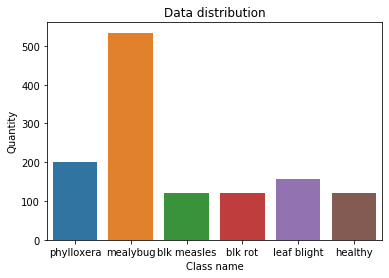

In [7]:
data_dist(total_phylloxera, total_mealybug, total_b_measles, total_b_rot, total_leaf_blight, total_healthy)

### Rename Images
The model may not be able to read a file with a very long name, so that all images should be named using a naming convention.

In [ ]:
def rename_images(path, image_class):
  """
  Standardize file names.
  @param path - the path to the image directory
  @param image_class - name of the image class, such as black measles or black rot
  """
  for i, image in enumerate(os.listdir(path)):
    name = image_class + str(i) + '.jpg'
    source = os.path.join(path, image)
    dest = os.path.join(path, name)
    os.rename(source, dest)
  print('Finish renaming.')

In [ ]:
# Rename images in each folder
rename_images(phylloxera_fold, image_class='phylloxera')
rename_images(mealybug_fold, image_class='mealybug')
rename_images(b_measles_fold, image_class='black_measles')
rename_images(b_rot_fold, image_class='black_rot')
rename_images(leaf_blight_fold, image_class='leaf_blight')
rename_images(healthy, image_class='healthy')


### Shuffle and split data into train, validation and test folder

Data will be splited based on the following rule: 80% of data for training and 20% for test. Afterwards, the training set will be divided into 80% training and 20% validation.

In [ ]:
def train_test_split_data(data_source, class_name, val_size=0.2, test_size=0.2):
  
  assert class_name in ['phylloxera', 'mealybug', 'black_measles', 'black_rot', 'leaf_blight', 'healthy'], \
    "Class name is invalid!"
  
  train_folder = os.path.join(data_source, 'train', class_name)
  val_folder = os.path.join(data_source, 'validation', class_name)
  test_folder = os.path.join(data_source, 'test', class_name)
  
  assert len(os.listdir(train_folder)) == 0, "Training directory must be empty."
  assert len(os.listdir(val_folder)) == 0, "Validation directory must be empty."
  assert len(os.listdir(test_folder)) == 0, "Test directory must be empty."
  
  path = os.path.join(data_source, class_name)
  total = len(os.listdir(path))
  
  # Shuffle the data
  data = os.listdir(path)
  random.shuffle(data)
  
  # Split train and test data: 80-20
  total_train = math.floor(total*0.8)
  total_test = total - total_train
  
  # Split train-validation data from train data: 80-20
  total_val = math.floor(total_train*0.2)
  total_train = total_train - total_val
  
  # Set data index
  train_dat = data[:total_train]
  val_dat = data[total_train:total_train+total_val]
  test_dat = data[total_train+total_val:]
    
  # Copy training data
  for file in train_dat:
    source = os.path.join(data_source, class_name, file)
    dest = os.path.join(train_folder, file)
    shutil.copyfile(source, dest)
    
  # Copy validation data
  for file in val_dat:
    source = os.path.join(data_source, class_name, file)
    dest = os.path.join(val_folder, file)
    shutil.copyfile(source, dest)
    
  # Copy test data
  for file in test_dat:
    source = os.path.join(data_source, class_name, file)
    dest = os.path.join(test_folder, file)
    shutil.copyfile(source, dest)

### Split data

In [ ]:
for class_name in ['phylloxera', 'mealybug', 'black_measles', 'black_rot', 'leaf_blight', 'healthy']:
  train_test_split_data(data, class_name)

### Checking data allocation after spliting

In [6]:
# Checking data
total_train_phylloxera = len(os.listdir(train_phylloxera))
total_train_mealybug = len(os.listdir(train_mealybug))
total_train_b_measles = len(os.listdir(train_b_measles))
total_train_b_rot = len(os.listdir(train_b_rot))
total_train_leaf_blight = len(os.listdir(train_leaf_blight))
total_train_healthy = len(os.listdir(train_healthy))

total_valid_phylloxera = len(os.listdir(val_phylloxera))
total_valid_mealybug = len(os.listdir(val_mealybug))
total_valid_b_measles = len(os.listdir(val_b_measles))
total_valid_b_rot = len(os.listdir(val_b_rot))
total_valid_leaf_blight = len(os.listdir(val_leaf_blight))
total_valid_healthy = len(os.listdir(val_healthy))

total_test_phylloxera = len(os.listdir(test_phylloxera))
total_test_mealybug = len(os.listdir(test_mealybug))
total_test_b_measles = len(os.listdir(test_b_measles))
total_test_b_rot = len(os.listdir(test_b_rot))
total_test_leaf_blight = len(os.listdir(test_leaf_blight))
total_test_healthy = len(os.listdir(test_healthy))

total_train = total_train_b_measles + total_train_b_rot + \
                total_train_leaf_blight + total_train_healthy + total_train_phylloxera + total_train_mealybug
total_valid = total_valid_b_measles + total_valid_b_rot + \
              total_valid_leaf_blight + total_valid_healthy + total_valid_phylloxera + total_valid_mealybug
total_test = total_test_b_measles + total_test_b_rot + \
              total_test_leaf_blight + total_test_healthy + total_test_phylloxera + total_test_mealybug

def check_dist(total, phylloxera, mealybug, black_measles, black_rot, leaf_blight, healthy):
  print('Phylloxera class occupies: {:.2f}%'.format((phylloxera / total)*100.0))
  print('Mealybug class occupies: {:.2f}%'.format((mealybug / total)*100.0))
  print('Black measles class occupies: {:.2f}%'.format((black_measles/total)*100.0))
  print('Black rot class occupies: {:.2f}%'.format((black_rot / total)*100))
  print('Left blight class occupies: {:.2f}%'.format((leaf_blight / total)*100.0))
  print('Healthy class occupies: {:.2f}%'.format((healthy / total)*100.0))
  print()
  
print('Total images:', total_train + total_valid + total_test)
print('Total phylloxera:', total_train_phylloxera + total_valid_phylloxera + total_test_phylloxera)
print('Total mealybug:', total_train_mealybug + total_valid_mealybug + total_test_mealybug)
print('Total black measles:', total_train_b_measles + total_valid_b_measles + total_test_b_measles)
print('Total black rot:', total_train_b_rot + total_valid_b_rot + total_test_b_rot)
print('Total leaf blight:', total_train_leaf_blight + total_valid_leaf_blight + total_test_leaf_blight)
print('Total healthy:', total_train_healthy + total_valid_healthy + total_test_healthy)
print()

print('Total of training phylloxera images:', total_train_phylloxera)
print('Total of training mealybug images:', total_train_mealybug)
print('Total of training black measles images:', total_train_b_measles)
print('Total of training black rot images:', total_train_b_rot)
print('Total of training leaf blight images:', total_train_leaf_blight)
print('Total of training healthy images:', total_train_healthy)
print()

print('Total of validation phylloxera images:', total_valid_phylloxera)
print('Total of validation mealybug images:', total_valid_mealybug)
print('Total of validation black measles images:', total_valid_b_measles)
print('Total of validation black rot images:', total_valid_b_rot)
print('Total of validation leaf blight images:', total_valid_leaf_blight)
print('Total of validation healthy images:', total_valid_healthy)
print()

print('Total of test phylloxera images:', total_test_phylloxera)
print('Total of test mealybug images:', total_test_mealybug)
print('Total of test black measles images:', total_test_b_measles)
print('Total of test black rot images:', total_test_b_rot)
print('Total of test leaf blight images:', total_test_leaf_blight)
print('Total of test healthy images:', total_test_healthy)
print()

print('Training distribution')
check_dist(total_train, total_train_b_measles, total_train_b_rot,
                    total_train_leaf_blight, total_train_healthy, total_train_phylloxera, total_train_mealybug)
print('Validation distribution')
check_dist(total_valid, total_valid_b_measles, total_valid_b_rot,
                    total_valid_leaf_blight, total_valid_healthy, total_valid_phylloxera, total_valid_mealybug)
print('Test distribution')
check_dist(total_test, total_test_b_measles, total_test_b_rot,
                    total_test_leaf_blight, total_test_healthy, total_test_phylloxera, total_test_mealybug)


Total images: 1250
Total phylloxera: 200
Total mealybug: 534
Total black measles: 120
Total black rot: 120
Total leaf blight: 156
Total healthy: 120

Total of training phylloxera images: 128
Total of training mealybug images: 342
Total of training black measles images: 77
Total of training black rot images: 77
Total of training leaf blight images: 100
Total of training healthy images: 77

Total of validation phylloxera images: 32
Total of validation mealybug images: 85
Total of validation black measles images: 19
Total of validation black rot images: 19
Total of validation leaf blight images: 24
Total of validation healthy images: 19

Total of test phylloxera images: 40
Total of test mealybug images: 107
Total of test black measles images: 24
Total of test black rot images: 24
Total of test leaf blight images: 32
Total of test healthy images: 24

Training distribution
Phylloxera class occupies: 9.61%
Mealybug class occupies: 9.61%
Black measles class occupies: 12.48%
Black rot class oc

## Data Analysis

### Observe Data Images

In [7]:
def read_data(path, size):
  img = image.load_img(path, target_size=size)
  img = image.img_to_array(img)
  return img

In [ ]:
def show_sample(data_source):
    CATE = ['phylloxera', 'mealybug', 'black_measles', 'black_rot', 'leaf_blight', 'healthy']
    NUM_CATE = len(CATE)
    img_height, img_width = 256, 256

    # Create image grid
    figure = plt.figure(num=1, figsize=(8,8))
    grid = ImageGrid(figure, 111, nrows_ncols=(NUM_CATE,NUM_CATE),
                     axes_pad=0.1) 

    # Plot each image into a square
    i = 0
    for cate in CATE:
      for j in range(6):
        ax = grid[i]
        path = os.path.join(data_source, cate)
        pic = cate + str(j) + '.jpg'
        im = read_data(os.path.join(path, pic), size=(img_height, img_width))
        ax.imshow(im/255., interpolation='nearest', aspect='auto')
        ax.axis('off')
        if i % NUM_CATE == NUM_CATE - 1:
          ax.text(x=img_height*1.05, y=img_height//2, s=cate, verticalalignment='center')
        i += 1

    figure.show();

In [ ]:
show_sample(data)

## Load images into numpy arrays

In [ ]:
def load_img_into_narr(label_numpy, train_label, bin_dir, numpy):
    
    # Read all images into numpy array
    label_numpy = [read_data(os.path.join(train_label, img),\
               (256, 256)) for img in os.listdir(train_label)]
    
    # Save numpy arrays into a folder
    np.save(os.path.join(bin_dir, numpy), arr=label_numpy)

In [ ]:
# Load numpy arrays from the folder
phylloxera_numpy = np.load(os.path.join(bin_data, 'phylloxera.npy'))
mealybug_numpy = np.load(os.path.join(bin_data, 'mealybug.npy'))
b_measles_numpy = np.load(os.path.join(bin_data, 'black_measles.npy'))
b_rot_numpy = np.load(os.path.join(bin_data, 'black_rot.npy'))
leaf_blight_numpy = np.load(os.path.join(bin_data, 'leaf_blight.npy'))
healthy_numpy = np.load(os.path.join(bin_data, 'healthy.npy'))

In [ ]:
# Read all phylloxera images into numpy array
load_img_into_narr(phylloxera_numpy, train_phylloxera, bin_data, numpy='phylloxera.npy')

# Read all mealybug images into numpy array
load_img_into_narr(mealybug_numpy, train_mealybug, bin_data, numpy='mealybug.npy')

# Read all black measles images into numpy array
load_img_into_narr(b_measles_numpy, train_b_measles, bin_data, numpy='black_measles.npy')

# Read all black rot images into numpy array
load_img_into_narr(b_rot_numpy, train_b_rot, bin_data, numpy='black_rot.npy')

# Read all leaf blight images into numpy array
load_img_into_narr(leaf_blight_numpy, train_leaf_blight, bin_data, numpy='leaf_blight.npy')

# Read all healthy images into numpy array
load_img_into_narr(healthy_numpy, train_healthy, bin_data, numpy='healthy.npy')

In [ ]:
# Reshape numpy arrays into sizes of 256x256x3 as input data
phylloxera_numpy = phylloxera_numpy.reshape(128, 256*256*3)
mealybug_numpy = mealybug_numpy.reshape(342, 256*256*3)
b_measles_numpy = b_measles_numpy.reshape(77, 256*256*3)
b_rot_numpy = b_rot_numpy.reshape(77, 256*256*3)
leaf_blight_numpy = leaf_blight_numpy.reshape(100, 256*256*3)
healthy_numpy = healthy_numpy.reshape(77, 256*256*3)

### Visualize data

In [8]:
def pca(X=np.array([]), num_dimensions=60):
  """
  Runs PCA on an array X to reduce its dimensonality to 
  num_dimensions dimensions.
  
  """
  print('Running PCA ...')
  mean_vector = np.mean(a=X, axis=0)
  X_cov = (X-mean_vec).T.dot(X-mean_vec) / (X.shape[0]-1)
  eig_vals, eig_vectors = np.linalg.eig(X_cov.T)
  idx = np.argsort(np.abs(eig_vals))[::-1]
  eig_vectors = eig_vectors[:, idx]
  Y = np.dot(X, eig_vectors[:, 0:num_dimensions])
  return Y

def plot_scatter(x, class_name):
  """
  Function to create a scatter plot for visualization of data
  along with respective colors/labels.
 
  """
  no_class = len(np.unique(class_name))
  color_palette = np.array(sns.color_palette('Set2', no_class))
  f = plt.figure(figsize=(10,10))
  ax = plt.subplot(aspect='equal')
  for i, pic_label in enumerate(np.unique(class_name)):
    idx = np.where(class_name == pic_label)
    ax.scatter(x[idx,0], x[idx,1], s=30, alpha=0.6, 
                    c=[color_palette[i]], label=pic_label)
  ax.legend(loc='best', fontsize='medium')
  ax.axis('off')
  ax.axis('tight')
  plt.title('Visualization of grape diseases and pests in 2D')

In [ ]:
# Create data labels for all classes in 1D
phylloxera_label = np.full(phylloxera_numpy.shape[0], 'phylloxera')
mealybug_label = np.full(mealybug_numpy.shape[0], 'mealybug')
b_measles_label = np.full(b_measles_numpy.shape[0], 'black_measles')
b_rot_label = np.full(b_rot_numpy.shape[0], 'black_rot')
leaf_blight_label = np.full(leaf_blight_numpy.shape[0], 'leaf_blight')
healthy_label = np.full(healthy_numpy.shape[0], 'healthy')

labels = (phylloxera_label, mealybug_label, b_measles_label, b_rot_label, leaf_blight_label, healthy_label)
labels = np.hstack(labels) 

In [ ]:
# Create a stack of numpy arrays 
tuple_data = (phylloxera_numpy, mealybug_numpy, b_measles_numpy, b_rot_numpy, leaf_blight_numpy, healthy_numpy)

# normalize tuple data
nomalized_data = np.vstack(tup=tuple_data)/255. 

In [ ]:
# Run PCA on nomalized data
start_time = time.time()
pca = PCA(n_components=60)
nomalized_data_pca = pca.fit_transform(nomalized_data)
end_time = time.time()

print('This process took {:.2f} seconds.'.format(end_time-start_time))

In [ ]:
# Run t-SNE on data
start_time = time.time()
tsne = TSNE(n_components=2)
nomalized_data_tsne = tsne.fit_transform(nomalized_data_pca)
end_time = time.time()

print('This process took {:.2f} seconds'.format(end_time-start_time))

In [ ]:
# Visualize data
plot_scatter(nomalized_data_tsne, labels);

## Training data

### Libraries

In [9]:
def draw_acc_loss(points, factor=0.9):
  
  drawed_points = []
  for point in points:
    if drawed_points:
      prev = drawed_points[-1]
      drawed_points.append(prev * factor + point * (1 - factor))
    else:
      drawed_points.append(point)
  return drawed_points

def plot_data(history_data, smooth=False):

  accuracy = history.history['acc']
  validation_acc = history.history['val_acc']
  loss = history.history['loss']
  validation_loss = history.history['val_loss']

  epochs = range(1, len(accuracy)+1)
  
  if smooth == True:
    accuracy = draw_acc_loss(accuracy)
    validation_acc = draw_acc_loss(validation_acc)
    loss = draw_acc_loss(loss)
    validation_loss = draw_acc_loss(validation_loss)

  plt.plot(epochs, accuracy, 'g', label='Training accuracy')
  plt.plot(epochs, validation_acc,'r', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend()
  plt.savefig('output/Acc-Epoch-{}.png'.format(epochs))
  plt.figure()

  plt.plot(epochs, loss, 'g', label='Training loss')
  plt.plot(epochs, validation_loss, 'r', label='Validation loss')
  plt.title('Training and validation loss')
  plt.legend()
  plt.savefig('output/Loss-Epoch-{}.png'.format(epochs))
  plt.show()
  plt.close()

def collect_metrics(model, generator, steps, class_names=[]):
  """
  Print out confusion matrix and classification report.
  """
  class_names = ['black_measles', 'black_rot', 'healthy', 'leaf_blight', 'mealybug', 'phylloxera']
  abbr = ['BM', 'BR', 'H', 'LB', 'M', 'P']
  
  # Generate predictions 
  y_pred = model.predict_generator(generator=generator, steps=steps)
  y_pred = np.argmax(a=y_pred, axis=1)
  
  # Generate confusion matrix
  con_matrix = confusion_matrix(y_true=generator.classes, y_pred=y_pred)
  fig, ax = plt.subplots(1)
  ax = sns.heatmap(con_matrix, ax=ax, cmap=plt.cm.YlOrRd, annot=True, fmt='g')
  ax.set_xticklabels(abbr)
  ax.set_yticklabels(abbr)
  plt.title('Confusion Matrix')
  plt.xlabel('Predicted Class')
  plt.ylabel('Real Class')
  plt.show()
  
  # Generate classification report
  print('Classification Report')
  print(classification_report(y_true=generator.classes, y_pred=y_pred, 
                              target_names=class_names))

### Set up hyper-parameters

In [10]:
image_height, image_width = 256, 256
batch_size = 30
epochs = 40

print('Total number of training data:', total_train)
print('Total number of validation data:', total_valid)
print('Total number of test data:', total_test)

Total number of training data: 801
Total number of validation data: 198
Total number of test data: 251


### Training from Scratch

In [11]:
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu', \
                  input_shape=(image_height, image_width, 3)),
    keras.layers.MaxPooling2D(pool_size=(2,2)),
    #keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'),
    #keras.layers.MaxPooling2D(pool_size=(2,2)),
    #keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu'),
    #keras.layers.MaxPooling2D(pool_size=(2,2)),
    #keras.layers.Conv2D(filters=128, kernel_size=(3,3), activation='relu'),
    #keras.layers.MaxPooling2D(pool_size=(2,2)),
    keras.layers.Flatten(),
    #keras.layers.Dense(units=512, activation='relu'),
    keras.layers.Dense(units=3, activation='relu'),
    keras.layers.Dense(units=6, activation='softmax')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 254, 254, 64)      1792      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 127, 127, 64)      0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1032256)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 3096771   
_________________________________________________________________
dense_2 (Dense)              (None, 6)                 24        
Total params: 3,098,587
Trainable params: 3,098,587
Non-trainable params: 0
_________________________________________________________________


In [12]:
model.compile(loss='categorical_crossentropy', 
              optimizer=optimizers.Adam(lr=0.001),
              metrics=['acc'])

Training data using Keras ImageDataGenerator. Refer to the source on the website: https://medium.com/@vijayabhaskar96/tutorial-image-classification-with-keras-flow-from-directory-and-generators-95f75ebe5720

In [38]:
# Rescale data
training_datagenerator = ImageDataGenerator(rescale=1./255)
test_datagenerator = ImageDataGenerator(rescale=1./255)

training_gen = training_datagenerator.flow_from_directory(
                    train_fold,
                    target_size=(image_height, image_width),
                    color_mode='rgb',
                    batch_size=batch_size,
                    class_mode='categorical',
                    shuffle=True, 
                    seed=30)

valid_gen = test_datagenerator.flow_from_directory(
                          val_fold,
                          target_size=(image_height, image_width),
                          color_mode='rgb',
                          batch_size=batch_size,
                          class_mode='categorical')

Found 801 images belonging to 6 classes.
Found 198 images belonging to 6 classes.


#### Build custom metrics 

In [14]:
def recall(y_true, y_pred):
    y_true = K.ones_like(y_true) 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    all_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    
    recall = true_positives / (all_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    y_true = K.ones_like(y_true) 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_score(y_true, y_pred):
    precision1 = precision(y_true, y_pred)
    recall1 = recall(y_true, y_pred)
    return 2*((precision1*recall1)/(precision1+recall1+K.epsilon()))


In [15]:
# Build custom metrics 
class MulticlassTruePositives(tf.keras.metrics.Metric):
    def __init__(self, name='multiclass_true_positives', **kwargs):
        super(MulticlassTruePositives, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.reshape(tf.argmax(y_pred, axis=1), shape=(-1, 1))
        values = tf.cast(y_true, 'int32') == tf.cast(y_pred, 'int32')
        values = tf.cast(values, 'float32')
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, 'float32')
            values = tf.multiply(values, sample_weight)
        self.true_positives.assign_add(tf.reduce_sum(values))

    def result(self):
        return self.true_positives

    def reset_states(self):
        # The state of the metric will be reset at the start of each epoch.
        self.true_positives.assign(0.)

#### Check training performance on each epoch

In [16]:

import os

from tensorflow.keras.callbacks import Callback
import matplotlib.pyplot as plt
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc


class PerformanceVisualizationCallback(Callback):
    def __init__(self, model, generator, steps, image_dir):
        super().__init__()
        self.model = model
        self.generator = generator
        self.steps = steps
        
        os.makedirs(image_dir, exist_ok=True)
        self.image_dir = image_dir

    def on_epoch_end(self, epoch, logs={}):
        y_pred = self.model.predict_generator(self.generator, self.steps)
        y_true = self.generator.classes
     
 
        y_pred_class = np.argmax(y_pred, axis=1)

        # plot and save confusion matrix
        fig, ax = plt.subplots(figsize=(16,12))
        plot_confusion_matrix(y_true, y_pred_class, ax=ax)
        fig.savefig(os.path.join(self.image_dir, f'confusion_matrix_epoch_{epoch}'))

       # plot and save roc curve
        fig, ax = plt.subplots(figsize=(16,12))
        plot_roc(y_true, y_pred, ax=ax)
        fig.savefig(os.path.join(self.image_dir, f'roc_curve_epoch_{epoch}'))

#### Log training history to Neptune

In [17]:

from tensorflow.keras.callbacks import Callback
import neptune
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc
import matplotlib.pyplot as plt


neptune.init('chittp/sandbox', api_token='eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vdWkubmVwdHVuZS5haSIsImFwaV91cmwiOiJodHRwczovL3VpLm5lcHR1bmUuYWkiLCJhcGlfa2V5IjoiOWIyYjA2NmQtZDQ4Yy00M2E0LTkyOTktNTkyYWFmMjQzMWZmIn0=')
neptune.create_experiment(name='minimal_example')

class NeptuneLoggerCallback(Callback):
    def __init__(self, model, generator, steps):
        super().__init__()
        self.model = model
        self.generator = generator
        self.steps = steps

    def on_batch_end(self, batch, logs={}):
        for log_name, log_value in logs.items():
            neptune.log_metric(f'batch_{log_name}', log_value)

    def on_epoch_end(self, epoch, logs={}):
        for log_name, log_value in logs.items():
            neptune.log_metric(f'epoch_{log_name}', log_value)

        y_pred = self.model.predict_generator(self.generator, self.steps)
        y_true = self.generator.classes

        y_pred_class = np.argmax(y_pred, axis=1)

        fig, ax = plt.subplots(figsize=(16, 12))
        plot_confusion_matrix(y_true, y_pred_class, ax=ax)
        neptune.log_image('confusion_matrix', fig)

        fig, ax = plt.subplots(figsize=(16, 12))
        plot_roc(y_true, y_pred, ax=ax)
        neptune.log_image('roc_curve', fig)

Project(chittp/sandbox)

NVMLError: NVML Shared Library Not Found - GPU usage metrics may not be reported.


https://ui.neptune.ai/chittp/sandbox/e/SAN-128


Experiment(SAN-128)

In [18]:
# Create a new validation generator for evaluation
valid_test_gen = test_datagenerator.flow_from_directory(
                val_fold,
                target_size=(image_height, image_width),
                color_mode='rgb',
                batch_size=1,
                class_mode='categorical',
                shuffle=False)

Found 198 images belonging to 6 classes.


In [19]:
neptune_logger=NeptuneLoggerCallback(model=model,
                                     generator=valid_test_gen, steps=total_valid)


In [ ]:
checkpointer = ModelCheckpoint(filepath="worst_weights.h5", 
                              monitor="val_loss",
                                verbose=0,
                                save_best_only=False,
                                save_weights_only=True,
                                mode="auto")

In [20]:
checkpointer = ModelCheckpoint(filepath="worst_weight_1000img_5layers.h5",
  monitor = "val_loss",
  verbose = 0,
  save_best_only = False,
  save_weights_only = True,
  mode =  "max")

In [ ]:
checkpointer = ModelCheckpoint(filepath="best_weights_new.h5", 
                               monitor = 'val_acc',
                               verbose=1, 
                               save_best_only=True,
                               save_weights_only=True,
                               mode="auto")

In [21]:
from tensorflow.keras import metrics

# Compile the model and avoid overfitting by utilizing a much smaller learning rate
model.compile(optimizer=optimizers.Adam(lr=2e-5),
              loss='categorical_crossentropy',
              metrics=['acc', metrics.mean_squared_error, 
                       metrics.mean_absolute_error, 
                       metrics.mean_absolute_percentage_error,
                       metrics.categorical_accuracy, 
                       precision, 
                       recall, f1_score])

In [22]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

from datetime import datetime
from packaging import version

import tensorflow as tf

# Define the Keras TensorBoard callback.
logdir="logs\\fit\\" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1, profile_batch=0)
    

Epoch 1/40


C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


 1/26 [>.............................] - ETA: 1:38 - loss: 1.7859 - acc: 0.2000 - mean_squared_error: 0.1386 - mean_absolute_error: 0.2774 - mean_absolute_percentage_error: 138722176.0000 - categorical_accuracy: 0.2000 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0000e+00

C:\Users\chitt\Anaconda3\lib\site-packages\keras\callbacks\callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (3.240248). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


 2/26 [=>............................] - ETA: 1:40 - loss: 1.7701 - acc: 0.1667 - mean_squared_error: 0.1380 - mean_absolute_error: 0.2721 - mean_absolute_percentage_error: 136069392.0000 - categorical_accuracy: 0.1667 - precision: 0.0000e+00 - recall: 0.0000e+00 - f1_score: 0.0000e+00

C:\Users\chitt\Anaconda3\lib\site-packages\keras\callbacks\callbacks.py:95: RuntimeWarning: Method (on_train_batch_end) is slow compared to the batch update (1.621602). Check your callbacks.
  % (hook_name, delta_t_median), RuntimeWarning)


26/26 [==============================] - 35s 1s/step - loss: 1.4845 - acc: 0.4205 - mean_squared_error: 0.1181 - mean_absolute_error: 0.2451 - mean_absolute_percentage_error: 122556376.0000 - categorical_accuracy: 0.4205 - precision: 0.5000 - recall: 0.0175 - f1_score: 0.0335 - val_loss: 1.3190 - val_acc: 0.4722 - val_mean_squared_error: 0.1022 - val_mean_absolute_error: 0.2221 - val_mean_absolute_percentage_error: 111063176.0000 - val_categorical_accuracy: 0.4722 - val_precision: 1.0000 - val_recall: 0.0528 - val_f1_score: 0.1002
Epoch 2/40
 9/26 [=========>....................] - ETA: 17s - loss: 1.1991 - acc: 0.4253 - mean_squared_error: 0.0991 - mean_absolute_error: 0.2142 - mean_absolute_percentage_error: 107123712.0000 - categorical_accuracy: 0.4253 - precision: 1.0000 - recall: 0.0590 - f1_score: 0.1109

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 1.1408 - acc: 0.4672 - mean_squared_error: 0.0934 - mean_absolute_error: 0.2048 - mean_absolute_percentage_error: 102404008.0000 - categorical_accuracy: 0.4672 - precision: 1.0000 - recall: 0.0725 - f1_score: 0.1346 - val_loss: 1.2298 - val_acc: 0.5060 - val_mean_squared_error: 0.0867 - val_mean_absolute_error: 0.1885 - val_mean_absolute_percentage_error: 94239840.0000 - val_categorical_accuracy: 0.5060 - val_precision: 1.0000 - val_recall: 0.0920 - val_f1_score: 0.1679
Epoch 3/40
10/26 [==========>...................] - ETA: 18s - loss: 1.1518 - acc: 0.4800 - mean_squared_error: 0.0944 - mean_absolute_error: 0.2035 - mean_absolute_percentage_error: 101741296.0000 - categorical_accuracy: 0.4800 - precision: 1.0000 - recall: 0.0711 - f1_score: 0.1325

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 31s 1s/step - loss: 1.0544 - acc: 0.5344 - mean_squared_error: 0.0869 - mean_absolute_error: 0.1878 - mean_absolute_percentage_error: 93880576.0000 - categorical_accuracy: 0.5344 - precision: 1.0000 - recall: 0.0852 - f1_score: 0.1566 - val_loss: 1.0100 - val_acc: 0.5833 - val_mean_squared_error: 0.0847 - val_mean_absolute_error: 0.1870 - val_mean_absolute_percentage_error: 93522648.0000 - val_categorical_accuracy: 0.5833 - val_precision: 1.0000 - val_recall: 0.0898 - val_f1_score: 0.1646
Epoch 4/40
 7/26 [=======>......................] - ETA: 20s - loss: 0.9879 - acc: 0.6048 - mean_squared_error: 0.0802 - mean_absolute_error: 0.1793 - mean_absolute_percentage_error: 89649024.0000 - categorical_accuracy: 0.6048 - precision: 1.0000 - recall: 0.0897 - f1_score: 0.1641

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.9910 - acc: 0.5888 - mean_squared_error: 0.0811 - mean_absolute_error: 0.1788 - mean_absolute_percentage_error: 89416760.0000 - categorical_accuracy: 0.5888 - precision: 1.0000 - recall: 0.0881 - f1_score: 0.1616 - val_loss: 1.0289 - val_acc: 0.6369 - val_mean_squared_error: 0.0834 - val_mean_absolute_error: 0.1836 - val_mean_absolute_percentage_error: 91782056.0000 - val_categorical_accuracy: 0.6369 - val_precision: 1.0000 - val_recall: 0.0843 - val_f1_score: 0.1550
Epoch 5/40
12/26 [============>.................] - ETA: 20s - loss: 0.9601 - acc: 0.5983 - mean_squared_error: 0.0791 - mean_absolute_error: 0.1740 - mean_absolute_percentage_error: 86990872.0000 - categorical_accuracy: 0.5983 - precision: 1.0000 - recall: 0.0902 - f1_score: 0.1652

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 37s 1s/step - loss: 0.9198 - acc: 0.6213 - mean_squared_error: 0.0755 - mean_absolute_error: 0.1675 - mean_absolute_percentage_error: 83738520.0000 - categorical_accuracy: 0.6213 - precision: 1.0000 - recall: 0.0933 - f1_score: 0.1704 - val_loss: 1.0192 - val_acc: 0.6071 - val_mean_squared_error: 0.0761 - val_mean_absolute_error: 0.1653 - val_mean_absolute_percentage_error: 82653760.0000 - val_categorical_accuracy: 0.6071 - val_precision: 1.0000 - val_recall: 0.0969 - val_f1_score: 0.1763
Epoch 6/40
 8/26 [========>.....................] - ETA: 20s - loss: 0.9302 - acc: 0.5584 - mean_squared_error: 0.0790 - mean_absolute_error: 0.1710 - mean_absolute_percentage_error: 85483120.0000 - categorical_accuracy: 0.5584 - precision: 1.0000 - recall: 0.0911 - f1_score: 0.1668

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.8993 - acc: 0.6278 - mean_squared_error: 0.0739 - mean_absolute_error: 0.1633 - mean_absolute_percentage_error: 81667168.0000 - categorical_accuracy: 0.6278 - precision: 1.0000 - recall: 0.0926 - f1_score: 0.1691 - val_loss: 0.8565 - val_acc: 0.6369 - val_mean_squared_error: 0.0757 - val_mean_absolute_error: 0.1618 - val_mean_absolute_percentage_error: 80905104.0000 - val_categorical_accuracy: 0.6369 - val_precision: 1.0000 - val_recall: 0.0975 - val_f1_score: 0.1773


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 7/40
 5/26 [====>.........................] - ETA: 23s - loss: 0.9358 - acc: 0.6400 - mean_squared_error: 0.0754 - mean_absolute_error: 0.1663 - mean_absolute_percentage_error: 83137848.0000 - categorical_accuracy: 0.6400 - precision: 1.0000 - recall: 0.0911 - f1_score: 0.1667

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.8886 - acc: 0.6641 - mean_squared_error: 0.0717 - mean_absolute_error: 0.1603 - mean_absolute_percentage_error: 80172832.0000 - categorical_accuracy: 0.6641 - precision: 1.0000 - recall: 0.0943 - f1_score: 0.1720 - val_loss: 0.7741 - val_acc: 0.5833 - val_mean_squared_error: 0.0789 - val_mean_absolute_error: 0.1647 - val_mean_absolute_percentage_error: 82343008.0000 - val_categorical_accuracy: 0.5833 - val_precision: 1.0000 - val_recall: 0.0938 - val_f1_score: 0.1712


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 8/40
 7/26 [=======>......................] - ETA: 21s - loss: 0.8558 - acc: 0.6857 - mean_squared_error: 0.0694 - mean_absolute_error: 0.1567 - mean_absolute_percentage_error: 78351592.0000 - categorical_accuracy: 0.6857 - precision: 1.0000 - recall: 0.0960 - f1_score: 0.1751

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.8525 - acc: 0.6782 - mean_squared_error: 0.0687 - mean_absolute_error: 0.1531 - mean_absolute_percentage_error: 76556696.0000 - categorical_accuracy: 0.6782 - precision: 1.0000 - recall: 0.0957 - f1_score: 0.1744 - val_loss: 0.9359 - val_acc: 0.6556 - val_mean_squared_error: 0.0742 - val_mean_absolute_error: 0.1607 - val_mean_absolute_percentage_error: 80351816.0000 - val_categorical_accuracy: 0.6556 - val_precision: 1.0000 - val_recall: 0.0926 - val_f1_score: 0.1693


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 9/40
18/26 [===================>..........] - ETA: 9s - loss: 0.8488 - acc: 0.6817 - mean_squared_error: 0.0684 - mean_absolute_error: 0.1530 - mean_absolute_percentage_error: 76511888.0000 - categorical_accuracy: 0.6817 - precision: 1.0000 - recall: 0.0976 - f1_score: 0.1776 

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.8370 - acc: 0.6952 - mean_squared_error: 0.0674 - mean_absolute_error: 0.1516 - mean_absolute_percentage_error: 75797568.0000 - categorical_accuracy: 0.6952 - precision: 1.0000 - recall: 0.0981 - f1_score: 0.1784 - val_loss: 0.8846 - val_acc: 0.7083 - val_mean_squared_error: 0.0666 - val_mean_absolute_error: 0.1493 - val_mean_absolute_percentage_error: 74662824.0000 - val_categorical_accuracy: 0.7083 - val_precision: 1.0000 - val_recall: 0.0960 - val_f1_score: 0.1750


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 10/40
12/26 [============>.................] - ETA: 16s - loss: 0.7898 - acc: 0.6895 - mean_squared_error: 0.0634 - mean_absolute_error: 0.1448 - mean_absolute_percentage_error: 72393880.0000 - categorical_accuracy: 0.6895 - precision: 1.0000 - recall: 0.0983 - f1_score: 0.1787

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 35s 1s/step - loss: 0.7865 - acc: 0.6926 - mean_squared_error: 0.0632 - mean_absolute_error: 0.1432 - mean_absolute_percentage_error: 71604896.0000 - categorical_accuracy: 0.6926 - precision: 1.0000 - recall: 0.1003 - f1_score: 0.1819 - val_loss: 1.0209 - val_acc: 0.6131 - val_mean_squared_error: 0.0808 - val_mean_absolute_error: 0.1648 - val_mean_absolute_percentage_error: 82387456.0000 - val_categorical_accuracy: 0.6131 - val_precision: 1.0000 - val_recall: 0.0914 - val_f1_score: 0.1670


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 11/40
12/26 [============>.................] - ETA: 16s - loss: 0.7994 - acc: 0.7293 - mean_squared_error: 0.0634 - mean_absolute_error: 0.1434 - mean_absolute_percentage_error: 71683072.0000 - categorical_accuracy: 0.7293 - precision: 1.0000 - recall: 0.1008 - f1_score: 0.1829

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.7972 - acc: 0.7178 - mean_squared_error: 0.0635 - mean_absolute_error: 0.1431 - mean_absolute_percentage_error: 71554392.0000 - categorical_accuracy: 0.7178 - precision: 1.0000 - recall: 0.1018 - f1_score: 0.1844 - val_loss: 0.7487 - val_acc: 0.6964 - val_mean_squared_error: 0.0641 - val_mean_absolute_error: 0.1414 - val_mean_absolute_percentage_error: 70703240.0000 - val_categorical_accuracy: 0.6964 - val_precision: 1.0000 - val_recall: 0.1065 - val_f1_score: 0.1923


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 12/40
12/26 [============>.................] - ETA: 16s - loss: 0.7541 - acc: 0.7236 - mean_squared_error: 0.0597 - mean_absolute_error: 0.1354 - mean_absolute_percentage_error: 67698696.0000 - categorical_accuracy: 0.7236 - precision: 1.0000 - recall: 0.1074 - f1_score: 0.1938

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 33s 1s/step - loss: 0.7783 - acc: 0.7185 - mean_squared_error: 0.0617 - mean_absolute_error: 0.1389 - mean_absolute_percentage_error: 69455784.0000 - categorical_accuracy: 0.7185 - precision: 1.0000 - recall: 0.1038 - f1_score: 0.1879 - val_loss: 0.9191 - val_acc: 0.6786 - val_mean_squared_error: 0.0729 - val_mean_absolute_error: 0.1564 - val_mean_absolute_percentage_error: 78193752.0000 - val_categorical_accuracy: 0.6786 - val_precision: 1.0000 - val_recall: 0.1000 - val_f1_score: 0.1815


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 13/40
22/26 [========================>.....] - ETA: 4s - loss: 0.7314 - acc: 0.7527 - mean_squared_error: 0.0579 - mean_absolute_error: 0.1321 - mean_absolute_percentage_error: 66052644.0000 - categorical_accuracy: 0.7527 - precision: 1.0000 - recall: 0.1073 - f1_score: 0.1933

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 31s 1s/step - loss: 0.7374 - acc: 0.7523 - mean_squared_error: 0.0583 - mean_absolute_error: 0.1328 - mean_absolute_percentage_error: 66383132.0000 - categorical_accuracy: 0.7523 - precision: 1.0000 - recall: 0.1062 - f1_score: 0.1916 - val_loss: 0.9806 - val_acc: 0.6786 - val_mean_squared_error: 0.0684 - val_mean_absolute_error: 0.1472 - val_mean_absolute_percentage_error: 73608360.0000 - val_categorical_accuracy: 0.6786 - val_precision: 1.0000 - val_recall: 0.0985 - val_f1_score: 0.1792


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 14/40
15/26 [================>.............] - ETA: 11s - loss: 0.7666 - acc: 0.7044 - mean_squared_error: 0.0615 - mean_absolute_error: 0.1363 - mean_absolute_percentage_error: 68131264.0000 - categorical_accuracy: 0.7044 - precision: 1.0000 - recall: 0.1056 - f1_score: 0.1906

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 31s 1s/step - loss: 0.7565 - acc: 0.7231 - mean_squared_error: 0.0604 - mean_absolute_error: 0.1336 - mean_absolute_percentage_error: 66791276.0000 - categorical_accuracy: 0.7231 - precision: 1.0000 - recall: 0.1064 - f1_score: 0.1920 - val_loss: 0.8642 - val_acc: 0.7024 - val_mean_squared_error: 0.0676 - val_mean_absolute_error: 0.1436 - val_mean_absolute_percentage_error: 71788128.0000 - val_categorical_accuracy: 0.7024 - val_precision: 1.0000 - val_recall: 0.1034 - val_f1_score: 0.1868


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 15/40
14/26 [===============>..............] - ETA: 12s - loss: 0.7531 - acc: 0.7543 - mean_squared_error: 0.0589 - mean_absolute_error: 0.1352 - mean_absolute_percentage_error: 67619192.0000 - categorical_accuracy: 0.7543 - precision: 1.0000 - recall: 0.1053 - f1_score: 0.1903

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.7311 - acc: 0.7510 - mean_squared_error: 0.0570 - mean_absolute_error: 0.1308 - mean_absolute_percentage_error: 65404800.0000 - categorical_accuracy: 0.7510 - precision: 1.0000 - recall: 0.1076 - f1_score: 0.1940 - val_loss: 0.9305 - val_acc: 0.6167 - val_mean_squared_error: 0.0784 - val_mean_absolute_error: 0.1498 - val_mean_absolute_percentage_error: 74898840.0000 - val_categorical_accuracy: 0.6167 - val_precision: 1.0000 - val_recall: 0.1065 - val_f1_score: 0.1919


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 16/40
25/26 [===========================>..] - ETA: 1s - loss: 0.7304 - acc: 0.7445 - mean_squared_error: 0.0572 - mean_absolute_error: 0.1293 - mean_absolute_percentage_error: 64638412.0000 - categorical_accuracy: 0.7445 - precision: 1.0000 - recall: 0.1082 - f1_score: 0.1947

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.7300 - acc: 0.7467 - mean_squared_error: 0.0572 - mean_absolute_error: 0.1293 - mean_absolute_percentage_error: 64632788.0000 - categorical_accuracy: 0.7467 - precision: 1.0000 - recall: 0.1081 - f1_score: 0.1945 - val_loss: 0.9158 - val_acc: 0.7024 - val_mean_squared_error: 0.0665 - val_mean_absolute_error: 0.1453 - val_mean_absolute_percentage_error: 72655600.0000 - val_categorical_accuracy: 0.7024 - val_precision: 1.0000 - val_recall: 0.1019 - val_f1_score: 0.1844


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 17/40
18/26 [===================>..........] - ETA: 8s - loss: 0.7210 - acc: 0.7593 - mean_squared_error: 0.0564 - mean_absolute_error: 0.1283 - mean_absolute_percentage_error: 64134772.0000 - categorical_accuracy: 0.7593 - precision: 1.0000 - recall: 0.1093 - f1_score: 0.1967

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.7313 - acc: 0.7474 - mean_squared_error: 0.0571 - mean_absolute_error: 0.1292 - mean_absolute_percentage_error: 64622428.0000 - categorical_accuracy: 0.7474 - precision: 1.0000 - recall: 0.1077 - f1_score: 0.1941 - val_loss: 0.7641 - val_acc: 0.6964 - val_mean_squared_error: 0.0625 - val_mean_absolute_error: 0.1331 - val_mean_absolute_percentage_error: 66564444.0000 - val_categorical_accuracy: 0.6964 - val_precision: 1.0000 - val_recall: 0.1151 - val_f1_score: 0.2062


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 18/40
17/26 [==================>...........] - ETA: 9s - loss: 0.6830 - acc: 0.7844 - mean_squared_error: 0.0534 - mean_absolute_error: 0.1224 - mean_absolute_percentage_error: 61223248.0000 - categorical_accuracy: 0.7844 - precision: 1.0000 - recall: 0.1098 - f1_score: 0.1975 

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6876 - acc: 0.7769 - mean_squared_error: 0.0537 - mean_absolute_error: 0.1221 - mean_absolute_percentage_error: 61057972.0000 - categorical_accuracy: 0.7769 - precision: 1.0000 - recall: 0.1107 - f1_score: 0.1990 - val_loss: 0.9351 - val_acc: 0.6964 - val_mean_squared_error: 0.0679 - val_mean_absolute_error: 0.1456 - val_mean_absolute_percentage_error: 72778824.0000 - val_categorical_accuracy: 0.6964 - val_precision: 1.0000 - val_recall: 0.1025 - val_f1_score: 0.1856


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 19/40
18/26 [===================>..........] - ETA: 8s - loss: 0.6841 - acc: 0.7627 - mean_squared_error: 0.0531 - mean_absolute_error: 0.1219 - mean_absolute_percentage_error: 60929132.0000 - categorical_accuracy: 0.7627 - precision: 1.0000 - recall: 0.1125 - f1_score: 0.2019

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6840 - acc: 0.7691 - mean_squared_error: 0.0530 - mean_absolute_error: 0.1218 - mean_absolute_percentage_error: 60912404.0000 - categorical_accuracy: 0.7691 - precision: 1.0000 - recall: 0.1116 - f1_score: 0.2006 - val_loss: 0.9342 - val_acc: 0.7143 - val_mean_squared_error: 0.0631 - val_mean_absolute_error: 0.1339 - val_mean_absolute_percentage_error: 66928432.0000 - val_categorical_accuracy: 0.7143 - val_precision: 1.0000 - val_recall: 0.1071 - val_f1_score: 0.1933


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 20/40
25/26 [===========================>..] - ETA: 1s - loss: 0.6629 - acc: 0.7800 - mean_squared_error: 0.0512 - mean_absolute_error: 0.1176 - mean_absolute_percentage_error: 58794864.0000 - categorical_accuracy: 0.7800 - precision: 1.0000 - recall: 0.1134 - f1_score: 0.2035

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6657 - acc: 0.7769 - mean_squared_error: 0.0514 - mean_absolute_error: 0.1180 - mean_absolute_percentage_error: 59005612.0000 - categorical_accuracy: 0.7769 - precision: 1.0000 - recall: 0.1133 - f1_score: 0.2034 - val_loss: 0.9872 - val_acc: 0.7024 - val_mean_squared_error: 0.0692 - val_mean_absolute_error: 0.1394 - val_mean_absolute_percentage_error: 69686128.0000 - val_categorical_accuracy: 0.7024 - val_precision: 1.0000 - val_recall: 0.1096 - val_f1_score: 0.1972


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 21/40
21/26 [=======================>......] - ETA: 5s - loss: 0.7011 - acc: 0.7536 - mean_squared_error: 0.0546 - mean_absolute_error: 0.1233 - mean_absolute_percentage_error: 61656792.0000 - categorical_accuracy: 0.7536 - precision: 1.0000 - recall: 0.1097 - f1_score: 0.1973

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6945 - acc: 0.7523 - mean_squared_error: 0.0541 - mean_absolute_error: 0.1215 - mean_absolute_percentage_error: 60733380.0000 - categorical_accuracy: 0.7523 - precision: 1.0000 - recall: 0.1117 - f1_score: 0.2005 - val_loss: 0.5779 - val_acc: 0.7381 - val_mean_squared_error: 0.0648 - val_mean_absolute_error: 0.1326 - val_mean_absolute_percentage_error: 66286812.0000 - val_categorical_accuracy: 0.7381 - val_precision: 1.0000 - val_recall: 0.1114 - val_f1_score: 0.2002


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 22/40
26/26 [==============================] - 30s 1s/step - loss: 0.6841 - acc: 0.7704 - mean_squared_error: 0.0531 - mean_absolute_error: 0.1199 - mean_absolute_percentage_error: 59927928.0000 - categorical_accuracy: 0.7704 - precision: 1.0000 - recall: 0.1109 - f1_score: 0.1992 - val_loss: 0.8043 - val_acc: 0.7333 - val_mean_squared_error: 0.0643 - val_mean_absolute_error: 0.1328 - val_mean_absolute_percentage_error: 66417732.0000 - val_categorical_accuracy: 0.7333 - val_precision: 1.0000 - val_recall: 0.1102 - val_f1_score: 0.1984


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 23/40
 3/26 [==>...........................] - ETA: 24s - loss: 0.6477 - acc: 0.8222 - mean_squared_error: 0.0497 - mean_absolute_error: 0.1145 - mean_absolute_percentage_error: 57260272.0000 - categorical_accuracy: 0.8222 - precision: 1.0000 - recall: 0.1148 - f1_score: 0.2057

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6660 - acc: 0.7860 - mean_squared_error: 0.0516 - mean_absolute_error: 0.1178 - mean_absolute_percentage_error: 58915876.0000 - categorical_accuracy: 0.7860 - precision: 1.0000 - recall: 0.1134 - f1_score: 0.2034 - val_loss: 0.7245 - val_acc: 0.7143 - val_mean_squared_error: 0.0710 - val_mean_absolute_error: 0.1429 - val_mean_absolute_percentage_error: 71457464.0000 - val_categorical_accuracy: 0.7143 - val_precision: 1.0000 - val_recall: 0.1043 - val_f1_score: 0.1888


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 24/40
 9/26 [=========>....................] - ETA: 18s - loss: 0.6670 - acc: 0.7778 - mean_squared_error: 0.0515 - mean_absolute_error: 0.1187 - mean_absolute_percentage_error: 59374048.0000 - categorical_accuracy: 0.7778 - precision: 1.0000 - recall: 0.1117 - f1_score: 0.2007

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


22/26 [========================>.....] - ETA: 4s - loss: 0.6512 - acc: 0.7773 - mean_squared_error: 0.0500 - mean_absolute_error: 0.1138 - mean_absolute_percentage_error: 56903892.0000 - categorical_accuracy: 0.7773 - precision: 1.0000 - recall: 0.1146 - f1_score: 0.2054

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6566 - acc: 0.7730 - mean_squared_error: 0.0505 - mean_absolute_error: 0.1153 - mean_absolute_percentage_error: 57647184.0000 - categorical_accuracy: 0.7730 - precision: 1.0000 - recall: 0.1139 - f1_score: 0.2042 - val_loss: 0.8295 - val_acc: 0.7202 - val_mean_squared_error: 0.0606 - val_mean_absolute_error: 0.1310 - val_mean_absolute_percentage_error: 65519776.0000 - val_categorical_accuracy: 0.7202 - val_precision: 1.0000 - val_recall: 0.1071 - val_f1_score: 0.1933


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 25/40
26/26 [==============================] - 30s 1s/step - loss: 0.6618 - acc: 0.7769 - mean_squared_error: 0.0507 - mean_absolute_error: 0.1152 - mean_absolute_percentage_error: 57608416.0000 - categorical_accuracy: 0.7769 - precision: 1.0000 - recall: 0.1136 - f1_score: 0.2038 - val_loss: 1.0721 - val_acc: 0.7262 - val_mean_squared_error: 0.0662 - val_mean_absolute_error: 0.1349 - val_mean_absolute_percentage_error: 67436776.0000 - val_categorical_accuracy: 0.7262 - val_precision: 1.0000 - val_recall: 0.1133 - val_f1_score: 0.2031


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 26/40
 9/26 [=========>....................] - ETA: 18s - loss: 0.7297 - acc: 0.7556 - mean_squared_error: 0.0556 - mean_absolute_error: 0.1256 - mean_absolute_percentage_error: 62810864.0000 - categorical_accuracy: 0.7556 - precision: 1.0000 - recall: 0.1056 - f1_score: 0.1907

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6421 - acc: 0.7886 - mean_squared_error: 0.0489 - mean_absolute_error: 0.1117 - mean_absolute_percentage_error: 55839684.0000 - categorical_accuracy: 0.7886 - precision: 1.0000 - recall: 0.1146 - f1_score: 0.2051 - val_loss: 0.7461 - val_acc: 0.7262 - val_mean_squared_error: 0.0663 - val_mean_absolute_error: 0.1382 - val_mean_absolute_percentage_error: 69105448.0000 - val_categorical_accuracy: 0.7262 - val_precision: 1.0000 - val_recall: 0.1037 - val_f1_score: 0.1877


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 27/40
 7/26 [=======>......................] - ETA: 20s - loss: 0.7158 - acc: 0.7619 - mean_squared_error: 0.0549 - mean_absolute_error: 0.1222 - mean_absolute_percentage_error: 61099044.0000 - categorical_accuracy: 0.7619 - precision: 1.0000 - recall: 0.1063 - f1_score: 0.1919

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6502 - acc: 0.7795 - mean_squared_error: 0.0500 - mean_absolute_error: 0.1138 - mean_absolute_percentage_error: 56899192.0000 - categorical_accuracy: 0.7795 - precision: 1.0000 - recall: 0.1137 - f1_score: 0.2040 - val_loss: 0.9013 - val_acc: 0.7083 - val_mean_squared_error: 0.0680 - val_mean_absolute_error: 0.1350 - val_mean_absolute_percentage_error: 67482848.0000 - val_categorical_accuracy: 0.7083 - val_precision: 1.0000 - val_recall: 0.1086 - val_f1_score: 0.1958


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 28/40
11/26 [===========>..................] - ETA: 15s - loss: 0.6293 - acc: 0.8131 - mean_squared_error: 0.0477 - mean_absolute_error: 0.1110 - mean_absolute_percentage_error: 55481648.0000 - categorical_accuracy: 0.8131 - precision: 1.0000 - recall: 0.1157 - f1_score: 0.2072

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6448 - acc: 0.7821 - mean_squared_error: 0.0491 - mean_absolute_error: 0.1121 - mean_absolute_percentage_error: 56070660.0000 - categorical_accuracy: 0.7821 - precision: 1.0000 - recall: 0.1143 - f1_score: 0.2049 - val_loss: 1.1136 - val_acc: 0.7083 - val_mean_squared_error: 0.0621 - val_mean_absolute_error: 0.1294 - val_mean_absolute_percentage_error: 64683372.0000 - val_categorical_accuracy: 0.7083 - val_precision: 1.0000 - val_recall: 0.1114 - val_f1_score: 0.2002


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 29/40
 1/26 [>.............................] - ETA: 27s - loss: 0.5230 - acc: 0.8667 - mean_squared_error: 0.0416 - mean_absolute_error: 0.0979 - mean_absolute_percentage_error: 48948168.0000 - categorical_accuracy: 0.8667 - precision: 1.0000 - recall: 0.1278 - f1_score: 0.2266

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6236 - acc: 0.7834 - mean_squared_error: 0.0477 - mean_absolute_error: 0.1091 - mean_absolute_percentage_error: 54568516.0000 - categorical_accuracy: 0.7834 - precision: 1.0000 - recall: 0.1159 - f1_score: 0.2073 - val_loss: 0.6339 - val_acc: 0.7111 - val_mean_squared_error: 0.0692 - val_mean_absolute_error: 0.1375 - val_mean_absolute_percentage_error: 68728408.0000 - val_categorical_accuracy: 0.7111 - val_precision: 1.0000 - val_recall: 0.1102 - val_f1_score: 0.1980


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 30/40
 3/26 [==>...........................] - ETA: 25s - loss: 0.6285 - acc: 0.8111 - mean_squared_error: 0.0474 - mean_absolute_error: 0.1097 - mean_absolute_percentage_error: 54841316.0000 - categorical_accuracy: 0.8111 - precision: 1.0000 - recall: 0.1167 - f1_score: 0.2089

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6444 - acc: 0.7795 - mean_squared_error: 0.0492 - mean_absolute_error: 0.1117 - mean_absolute_percentage_error: 55868312.0000 - categorical_accuracy: 0.7795 - precision: 1.0000 - recall: 0.1141 - f1_score: 0.2046 - val_loss: 1.0930 - val_acc: 0.7083 - val_mean_squared_error: 0.0677 - val_mean_absolute_error: 0.1281 - val_mean_absolute_percentage_error: 64053784.0000 - val_categorical_accuracy: 0.7083 - val_precision: 1.0000 - val_recall: 0.1210 - val_f1_score: 0.2156


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 31/40
 3/26 [==>...........................] - ETA: 24s - loss: 0.5841 - acc: 0.8111 - mean_squared_error: 0.0448 - mean_absolute_error: 0.1015 - mean_absolute_percentage_error: 50739824.0000 - categorical_accuracy: 0.8111 - precision: 1.0000 - recall: 0.1204 - f1_score: 0.2145

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6000 - acc: 0.7990 - mean_squared_error: 0.0458 - mean_absolute_error: 0.1046 - mean_absolute_percentage_error: 52292876.0000 - categorical_accuracy: 0.7990 - precision: 1.0000 - recall: 0.1187 - f1_score: 0.2120 - val_loss: 0.7784 - val_acc: 0.7202 - val_mean_squared_error: 0.0629 - val_mean_absolute_error: 0.1277 - val_mean_absolute_percentage_error: 63865952.0000 - val_categorical_accuracy: 0.7202 - val_precision: 1.0000 - val_recall: 0.1108 - val_f1_score: 0.1992


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 32/40
18/26 [===================>..........] - ETA: 8s - loss: 0.6932 - acc: 0.7533 - mean_squared_error: 0.0523 - mean_absolute_error: 0.1170 - mean_absolute_percentage_error: 58482624.0000 - categorical_accuracy: 0.7533 - precision: 1.0000 - recall: 0.1081 - f1_score: 0.1947

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6705 - acc: 0.7691 - mean_squared_error: 0.0508 - mean_absolute_error: 0.1143 - mean_absolute_percentage_error: 57173036.0000 - categorical_accuracy: 0.7691 - precision: 1.0000 - recall: 0.1099 - f1_score: 0.1977 - val_loss: 1.1251 - val_acc: 0.7143 - val_mean_squared_error: 0.0684 - val_mean_absolute_error: 0.1347 - val_mean_absolute_percentage_error: 67357632.0000 - val_categorical_accuracy: 0.7143 - val_precision: 1.0000 - val_recall: 0.1130 - val_f1_score: 0.2029


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 33/40
 8/26 [========>.....................] - ETA: 19s - loss: 0.4876 - acc: 0.8355 - mean_squared_error: 0.0372 - mean_absolute_error: 0.0869 - mean_absolute_percentage_error: 43438532.0000 - categorical_accuracy: 0.8355 - precision: 1.0000 - recall: 0.1287 - f1_score: 0.2278

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.5714 - acc: 0.8106 - mean_squared_error: 0.0435 - mean_absolute_error: 0.0998 - mean_absolute_percentage_error: 49908616.0000 - categorical_accuracy: 0.8106 - precision: 1.0000 - recall: 0.1208 - f1_score: 0.2152 - val_loss: 0.8928 - val_acc: 0.7560 - val_mean_squared_error: 0.0610 - val_mean_absolute_error: 0.1203 - val_mean_absolute_percentage_error: 60146492.0000 - val_categorical_accuracy: 0.7560 - val_precision: 1.0000 - val_recall: 0.1207 - val_f1_score: 0.2152


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 34/40
 5/26 [====>.........................] - ETA: 22s - loss: 0.6896 - acc: 0.7467 - mean_squared_error: 0.0524 - mean_absolute_error: 0.1182 - mean_absolute_percentage_error: 59101660.0000 - categorical_accuracy: 0.7467 - precision: 1.0000 - recall: 0.1089 - f1_score: 0.1960

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6412 - acc: 0.7769 - mean_squared_error: 0.0488 - mean_absolute_error: 0.1103 - mean_absolute_percentage_error: 55125276.0000 - categorical_accuracy: 0.7769 - precision: 1.0000 - recall: 0.1145 - f1_score: 0.2053 - val_loss: 0.7474 - val_acc: 0.7083 - val_mean_squared_error: 0.0681 - val_mean_absolute_error: 0.1350 - val_mean_absolute_percentage_error: 67520024.0000 - val_categorical_accuracy: 0.7083 - val_precision: 1.0000 - val_recall: 0.1071 - val_f1_score: 0.1933


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 35/40
 7/26 [=======>......................] - ETA: 19s - loss: 0.5467 - acc: 0.8259 - mean_squared_error: 0.0417 - mean_absolute_error: 0.0962 - mean_absolute_percentage_error: 48092472.0000 - categorical_accuracy: 0.8259 - precision: 1.0000 - recall: 0.1212 - f1_score: 0.2158

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.5963 - acc: 0.8045 - mean_squared_error: 0.0453 - mean_absolute_error: 0.1029 - mean_absolute_percentage_error: 51455528.0000 - categorical_accuracy: 0.8045 - precision: 1.0000 - recall: 0.1177 - f1_score: 0.2103 - val_loss: 0.7444 - val_acc: 0.7202 - val_mean_squared_error: 0.0644 - val_mean_absolute_error: 0.1321 - val_mean_absolute_percentage_error: 66050128.0000 - val_categorical_accuracy: 0.7202 - val_precision: 1.0000 - val_recall: 0.1102 - val_f1_score: 0.1979


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 36/40
22/26 [========================>.....] - ETA: 4s - loss: 0.5877 - acc: 0.8000 - mean_squared_error: 0.0444 - mean_absolute_error: 0.1007 - mean_absolute_percentage_error: 50326972.0000 - categorical_accuracy: 0.8000 - precision: 1.0000 - recall: 0.1174 - f1_score: 0.2098

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 31s 1s/step - loss: 0.6032 - acc: 0.7912 - mean_squared_error: 0.0456 - mean_absolute_error: 0.1027 - mean_absolute_percentage_error: 51357864.0000 - categorical_accuracy: 0.7912 - precision: 1.0000 - recall: 0.1161 - f1_score: 0.2076 - val_loss: 0.8985 - val_acc: 0.7333 - val_mean_squared_error: 0.0658 - val_mean_absolute_error: 0.1302 - val_mean_absolute_percentage_error: 65087488.0000 - val_categorical_accuracy: 0.7333 - val_precision: 1.0000 - val_recall: 0.1111 - val_f1_score: 0.2000


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 37/40
 9/26 [=========>....................] - ETA: 18s - loss: 0.6114 - acc: 0.7926 - mean_squared_error: 0.0464 - mean_absolute_error: 0.1062 - mean_absolute_percentage_error: 53075104.0000 - categorical_accuracy: 0.7926 - precision: 1.0000 - recall: 0.1160 - f1_score: 0.2078

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6134 - acc: 0.7951 - mean_squared_error: 0.0464 - mean_absolute_error: 0.1054 - mean_absolute_percentage_error: 52687192.0000 - categorical_accuracy: 0.7951 - precision: 1.0000 - recall: 0.1162 - f1_score: 0.2080 - val_loss: 1.0333 - val_acc: 0.7381 - val_mean_squared_error: 0.0659 - val_mean_absolute_error: 0.1330 - val_mean_absolute_percentage_error: 66484460.0000 - val_categorical_accuracy: 0.7381 - val_precision: 1.0000 - val_recall: 0.1114 - val_f1_score: 0.2002


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 38/40
12/26 [============>.................] - ETA: 15s - loss: 0.5507 - acc: 0.8167 - mean_squared_error: 0.0415 - mean_absolute_error: 0.0951 - mean_absolute_percentage_error: 47574552.0000 - categorical_accuracy: 0.8167 - precision: 1.0000 - recall: 0.1222 - f1_score: 0.2174

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.5834 - acc: 0.7951 - mean_squared_error: 0.0437 - mean_absolute_error: 0.0993 - mean_absolute_percentage_error: 49656796.0000 - categorical_accuracy: 0.7951 - precision: 1.0000 - recall: 0.1187 - f1_score: 0.2119 - val_loss: 0.8232 - val_acc: 0.7262 - val_mean_squared_error: 0.0657 - val_mean_absolute_error: 0.1295 - val_mean_absolute_percentage_error: 64727980.0000 - val_categorical_accuracy: 0.7262 - val_precision: 1.0000 - val_recall: 0.1127 - val_f1_score: 0.2022


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 39/40
14/26 [===============>..............] - ETA: 12s - loss: 0.6093 - acc: 0.7981 - mean_squared_error: 0.0465 - mean_absolute_error: 0.1051 - mean_absolute_percentage_error: 52551876.0000 - categorical_accuracy: 0.7981 - precision: 1.0000 - recall: 0.1164 - f1_score: 0.2082

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.6109 - acc: 0.8016 - mean_squared_error: 0.0464 - mean_absolute_error: 0.1044 - mean_absolute_percentage_error: 52213504.0000 - categorical_accuracy: 0.8016 - precision: 1.0000 - recall: 0.1159 - f1_score: 0.2073 - val_loss: 0.5904 - val_acc: 0.7381 - val_mean_squared_error: 0.0548 - val_mean_absolute_error: 0.1107 - val_mean_absolute_percentage_error: 55351776.0000 - val_categorical_accuracy: 0.7381 - val_precision: 1.0000 - val_recall: 0.1225 - val_f1_score: 0.2181


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

Epoch 40/40
14/26 [===============>..............] - ETA: 12s - loss: 0.5793 - acc: 0.7810 - mean_squared_error: 0.0440 - mean_absolute_error: 0.1000 - mean_absolute_percentage_error: 50024740.0000 - categorical_accuracy: 0.7810 - precision: 1.0000 - recall: 0.1206 - f1_score: 0.2152

C:\Users\chitt\Anaconda3\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


26/26 [==============================] - 30s 1s/step - loss: 0.5884 - acc: 0.7846 - mean_squared_error: 0.0447 - mean_absolute_error: 0.1008 - mean_absolute_percentage_error: 50423680.0000 - categorical_accuracy: 0.7846 - precision: 1.0000 - recall: 0.1188 - f1_score: 0.2122 - val_loss: 0.9575 - val_acc: 0.6845 - val_mean_squared_error: 0.0673 - val_mean_absolute_error: 0.1339 - val_mean_absolute_percentage_error: 66954632.0000 - val_categorical_accuracy: 0.6845 - val_precision: 1.0000 - val_recall: 0.1080 - val_f1_score: 0.1948


C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\chitt\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_op

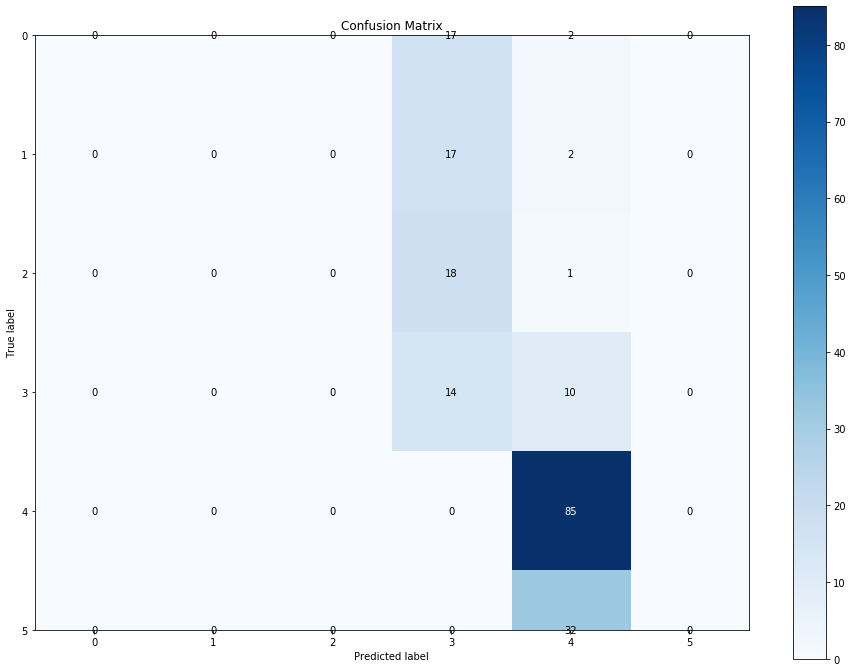

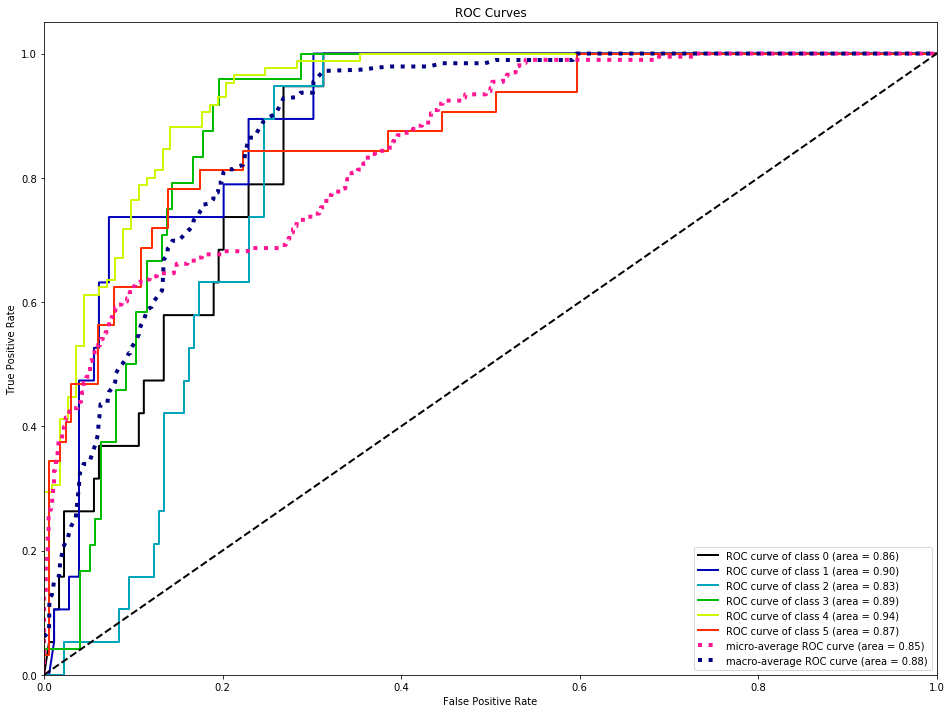

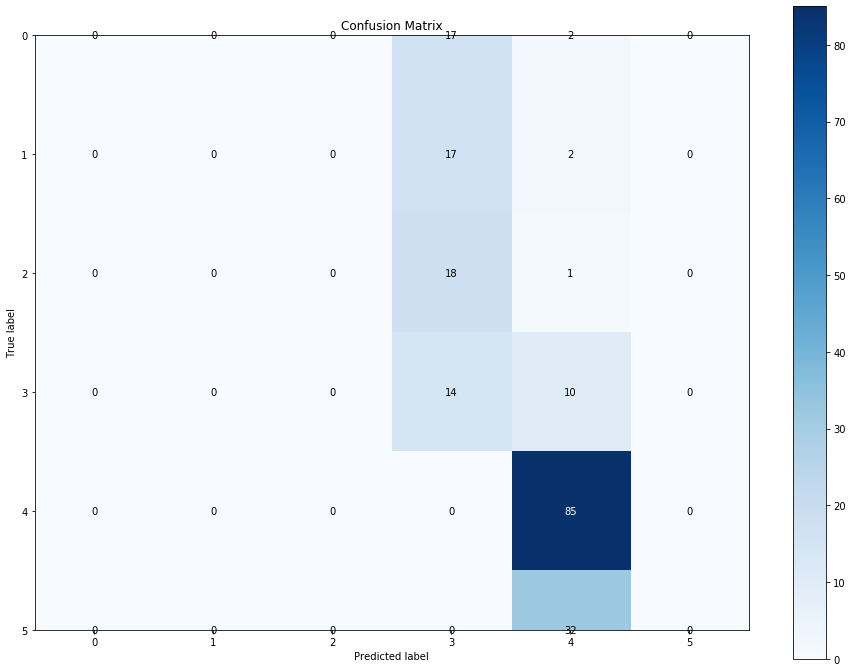

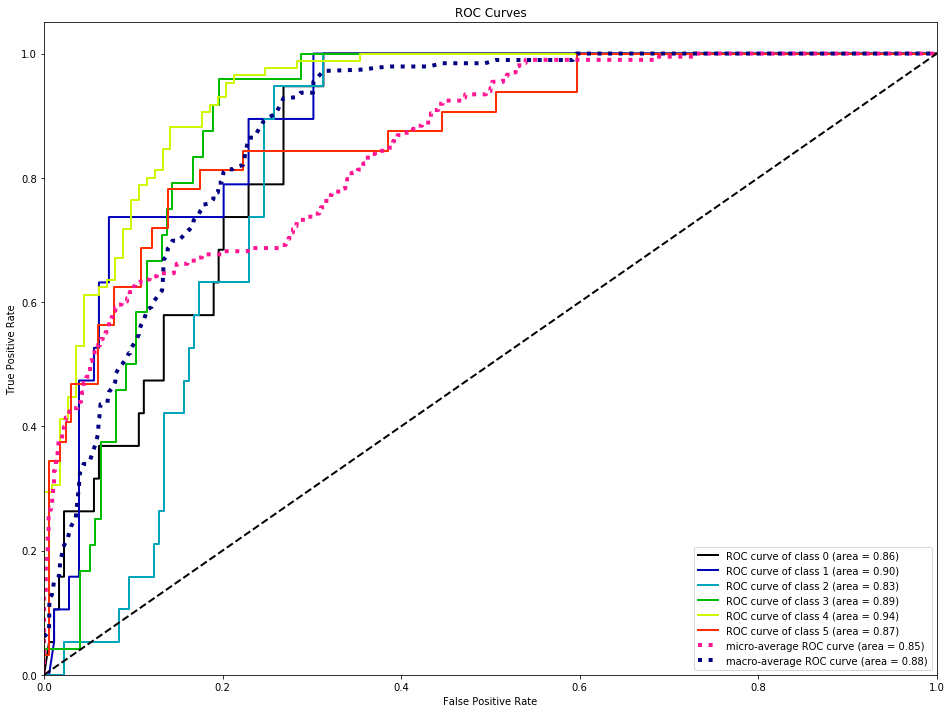

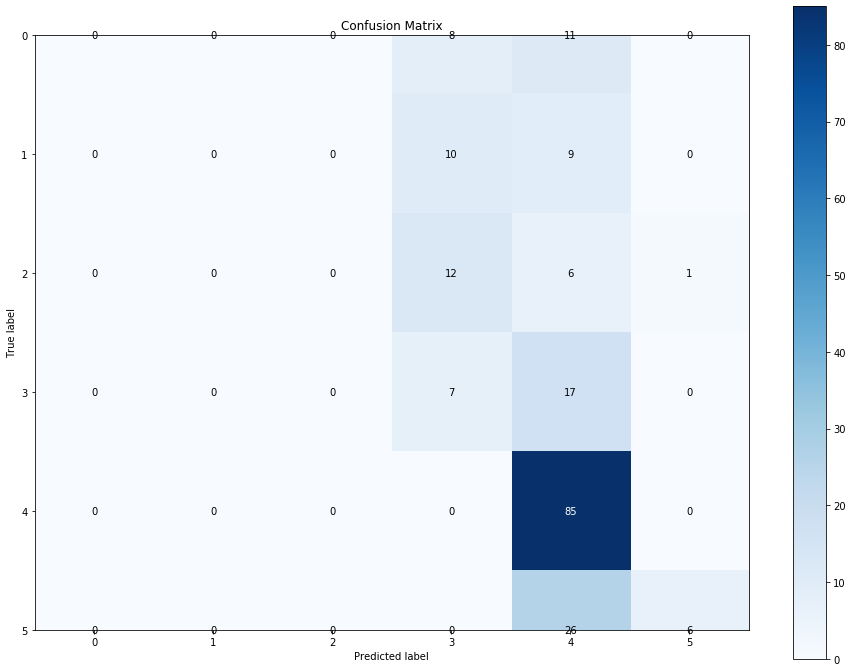

...

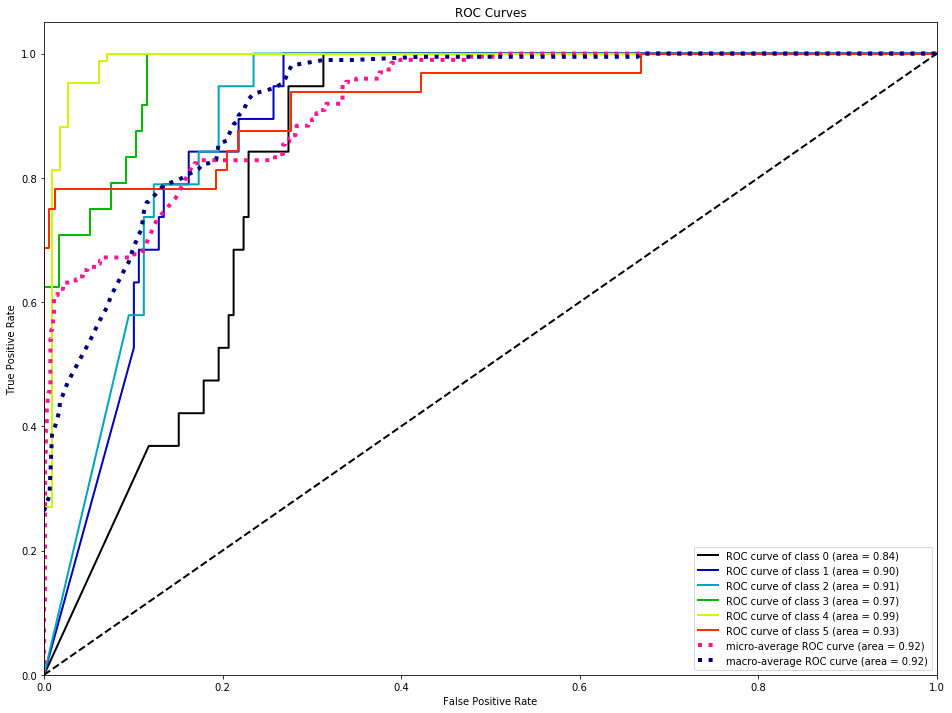

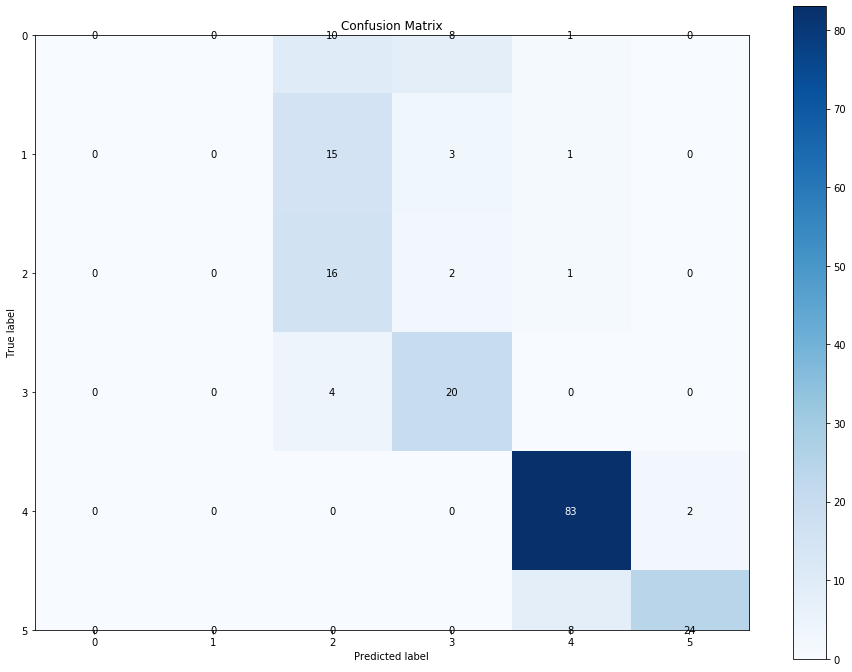

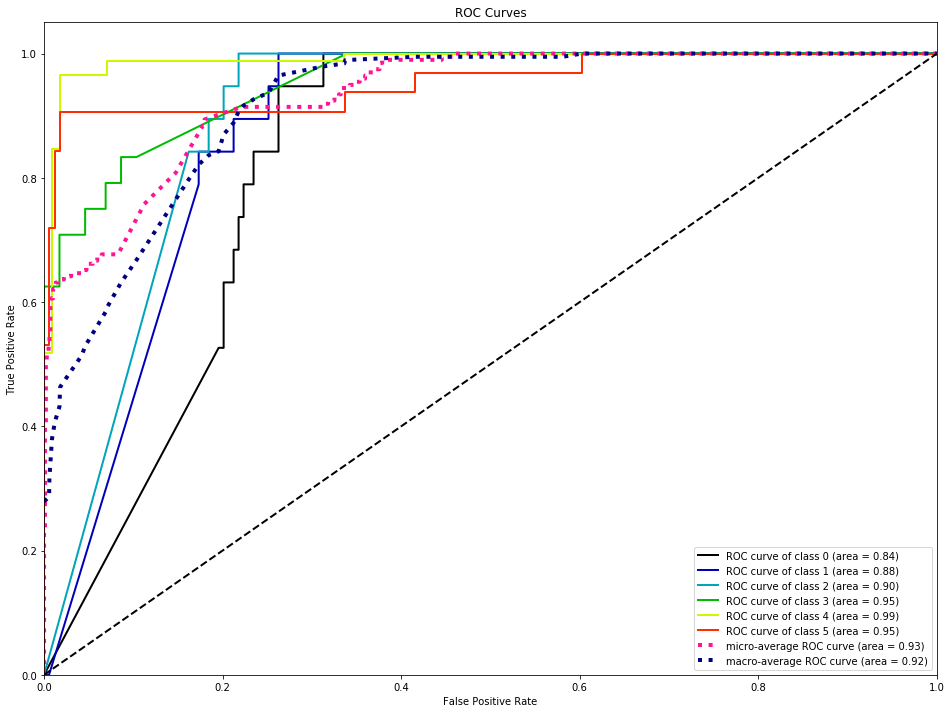

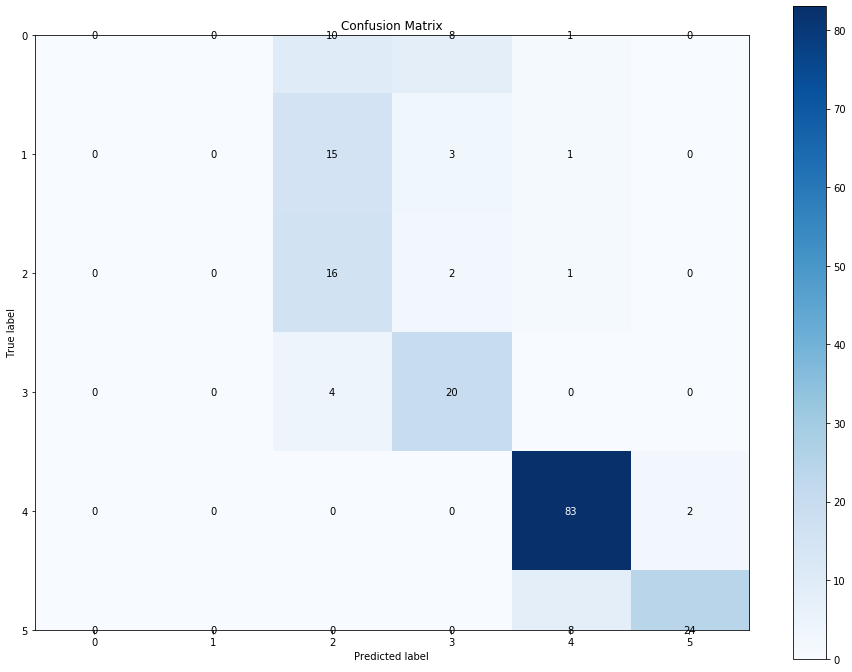

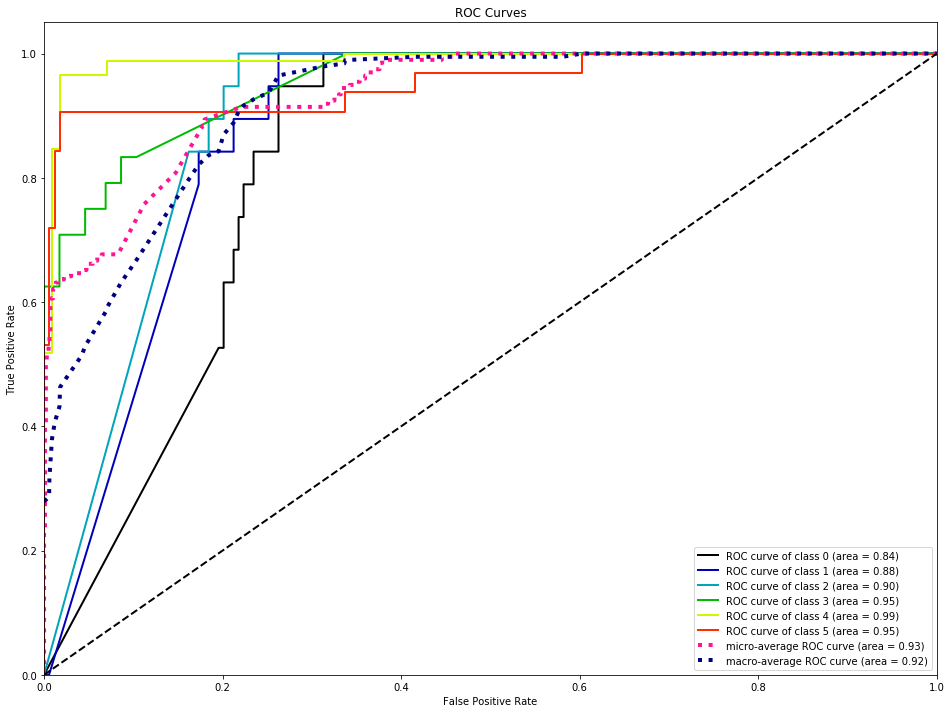

In [23]:
performance_cbk = PerformanceVisualizationCallback(
                      model=model,
                      generator=valid_test_gen, steps=total_valid,
                      image_dir='performance_vizualizations')


# Train the model
history = model.fit_generator(
            training_gen,
            steps_per_epoch=total_train // batch_size,
            epochs=epochs,
            validation_data=valid_gen,
            validation_steps=total_valid // batch_size,
            #callbacks=[tensorboard_callback, performance_cbk, checkpointer])
            callbacks=[tensorboard_callback, performance_cbk, neptune_logger, checkpointer])

In [33]:
model.load_weights('worst_weight_1000img_5layers.h5')
count = 0
for layer in model.layers:

    # Get layer name
    print("Layer name: ", layer.name, "\n")

    # Get layer configuration
    print("Layer configuration: ", layer.get_config(), "\n")

    # Get layer weights and bias
    w = layer.get_weights()
    if w != []:
        weights = layer.get_weights()[0]
        bias = layer.get_weights()[1]
        print("Layer weights: ", weights, "\n")
        print("Layer bias: ", bias, "\n")
    else:
        print("Layer weights and bias: ", w)
          

Layer name:  conv2d_1 

Layer configuration:  {'name': 'conv2d_1', 'trainable': True, 'batch_input_shape': (None, 256, 256, 3), 'dtype': 'float32', 'filters': 64, 'kernel_size': (3, 3), 'strides': (1, 1), 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': (1, 1), 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'VarianceScaling', 'config': {'scale': 1.0, 'mode': 'fan_avg', 'distribution': 'uniform', 'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None} 

Layer weights:  [[[[-0.07336567  0.10102893  0.0777314  ...  0.01692451  0.00221577
    -0.02071075]
   [-0.05230328 -0.0373176   0.04505958 ...  0.05709982  0.06648887
    -0.06561745]
   [ 0.07120351  0.08573613  0.09450474 ... -0.04450992  0.07439106
    -0.02518872]]

  [[ 0.00112431 -0.05041497 -0.0880774  ...  0.08177634  0.029783

In [29]:
def insert_model_bias_weight(model, conn):
    try:
        cur = conn.cursor()
        dt = datetime.now()
        nodenum = 0
        
        
        cur.execute('INSERT INTO models(id, name, createdAt, updatedAt) VALUES (%s, %s, %s, %s)', (1, 'CNN Grape diseases and classification', dt, dt,))
        cur.execute('INSERT INTO configurations(id, name, isOriginal, layerNum, activationFunction, regulation, learningRate, createdAt, updatedAt, modelId) VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s)', (1, 'CNN Grape diseases and classification' , True, len(model.layers), 'actFunction', 'regulation', '00.0', dt, dt, '1'))  
        
        count = 0
       
        for layer in model.layers:
            count = count + 1
            # Get layer name
            #print("Layer name: ", layer.name, "\n")

            # Get layer configuration
            #print("Layer configuration: ", layer.get_config(), "\n")
            cur.execute('INSERT INTO layers (id, name, createdAt, updatedAt, configurationId) VALUES (%s, %s, %s, %s, %s)', ( count, layer.name , dt, dt, '1', ))
            # Get layer weights and bias
            w = layer.get_weights()
            if w != []:
                weights = layer.get_weights()[0]
                biases = layer.get_weights()[1]
                layer_name = layer.name
                #print("Layer weights: ", weights, "\n")
                #print("Layer bias: ", biases, "\n")
            else:
                print("Layer weights and bias: ", w)
               
            for toNeuronNum, bias in enumerate(biases):
                #print(f'{layerNum} B -> L{layerNum+1} N{toNeuronNum}: {bias}')
                if ((float(bias)) < 0.00):
                    #print("Successful 1: ", bias)
                    nodenum = nodenum+1
                    neuronid = "L" + str(count+1)+"N"+str(toNeuronNum) 
                    #print("neuron id: ", neuronid)
                    cur.execute('INSERT INTO neurons(id, bias, type, activationFunction, createdAt, updatedAt, layerId) VALUES (%s, %s, %s, %s, %s, %s, %s)', ( neuronid, float(bias) , layer_name, 'actFunction', dt, dt, count))
                #if (layer.name[0:5]=="dense"):
                    #weights = layer.get_weights()[0]
                    for fromNeuronNum, wgt in enumerate(weights):
                        for toNeuronNum, wgt2 in enumerate(wgt):
                            #print(f'L{layerNum}N{fromNeuronNum} -> L{layerNum+1}N{toNeuronNum}={wgt2}')
                            fromNeuron = "L"+str(count)+"N"+str(fromNeuronNum)
                            toNeuron = "L"+str(count+1)+"N"+str(toNeuronNum)
                            if isinstance(wgt2,np.ndarray):
                                for totoNeuronNum, wgt3 in enumerate(wgt2):
                                    totoNeuron =  "L"+str(count+1)+"N"+str(totoNeuronNum)
                                    #print(f'L{layerNum}N{fromNeuronNum} -> L{layerNum+1}N{toNeuronNum} -> L{layerNum+1}N{totoNeuronNum} ={wgt3}')
                                    for tototoNeuronNum, wgt4 in enumerate(wgt3):
                                        if (float(wgt4) < 0.00):
                                            #print("Successful 2 ", wgt4)
                                            tototoNeuron = "L"+str(count+1)+"N"+str(toNeuronNum)+"-"+str(totoNeuronNum)+"-"+str(tototoNeuronNum)
                                            wgt4 = wgt4.astype(float)
                                            linkid=fromNeuron+tototoNeuron
                                            #print(f'L{layerNum}N{fromNeuronNum} -> L{layerNum+1}N{toNeuronNum} -> L{layerNum+1}N{totoNeuronNum} ->L{layerNum+1}N{tototoNeuronNum} = {wgt4}')
                                            cur.execute('INSERT INTO links(id, weight, createdAt, updatedAt, sourceId, destId) VALUES (%s, %s, %s, %s, %s , %s)', (linkid, wgt4, dt, dt, fromNeuron, tototoNeuronNum))
                            else:
                                if (float(wgt2) < 0.00):
                                    wgt2 = wgt2.astype(float)
                                    linkid=fromNeuron+toNeuron
                                    cur.execute('INSERT INTO links(id, weight, createdAt, updatedAt, sourceId, destId) VALUES (%s, %s, %s, %s, %s , %s)', (linkid, wgt2, dt, dt, fromNeuron, toNeuron))

                        #print(fromNeuron)
                        #wgt2 = wgt2.astype(float)
                        #linkid=fromNeuron+toNeuron
                        #cur.execute('INSERT INTO links(id, weight, createdAt, updatedAt, sourceId, destId) VALUES (%s, %s, %s, %s, %s , %s)', (linkid, wgt2, dt, dt, fromNeuron, toNeuron))

        conn.commit()
        cur.close()
    
    
    #except (Exception, psycopg2.DatabaseError) as error:
        #print(error)
    finally:
        if conn is not None:
            conn.close()
            print('Database connection closed.')
        
    return "finished"

In [30]:
import psycopg2
from datetime import datetime
dependencies = {
                       'precision': precision,
                       'recall': recall, 
                       'f1_score': f1_score}
#model = load_model('diseasepest-scratch.h5', custom_objects=dependencies)
model.load_weights('worst_weight_1000img_4layers.h5')
conn = psycopg2.connect(
    host="localhost",
    database="cmpe295",
    user="chittp",
    password="cmpe295")

model.summary() 

#AITesting.get_model_summary(model, conn)
#AITesting.get_bias_weight_in_each_layer(model)
insert_model_bias_weight(model, conn)


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 254, 254, 64)      1792      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 127, 127, 64)      0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1032256)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 3096771   
_________________________________________________________________
dense_2 (Dense)              (None, 6)                 24        
Total params: 3,098,587
Trainable params: 3,098,587
Non-trainable params: 0
_________________________________________________________________
Layer weights and bias:  []
Layer weights and bias:  []


Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.


Database connection closed.


'finished'

Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Experiencing connection interruptions. Reestablishing communication with Neptune.
Unexpected HTTP error in hardware metric reporting thread.
Traceback (most recent call last):
  File "C:\Users\chitt\Anaconda3\lib\site-packages\neptune\internal\threads\hardware_metric_reporting_thread.py", line 39, in run
    self.__metric_service.report_and_send(timestamp=time.time())
  File "C:\Users\chitt\Anaconda3\lib\site-packages\neptune\internal\hardware\metrics\service\metric_service.py", line 27, in report_and_send
    self.__backend.send_hardware_metric_reports(self.experiment, self.metrics_container.metrics(), metric_reports)
  File "C:\Users\chitt\Anaconda3\lib\site-packages\neptune\utils.py", line 210, in wrapper
    return func(*args, **kwargs)
  F

In [ ]:
model.save('shapes_cnn_latest.h5')

In [24]:
# Save the trained model into the pre-defined folder
model.save(os.path.join(trained_models, 'diseasepest-scratch-worst-weights-1000img.h5'))

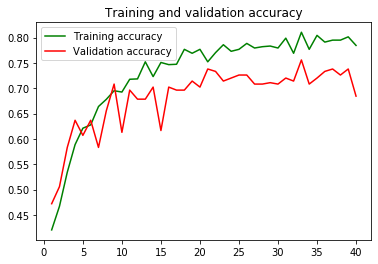

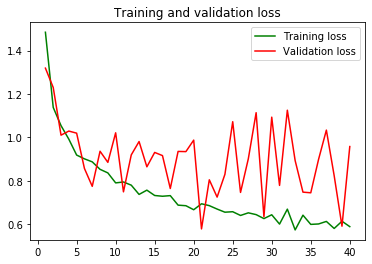

In [25]:
plot_data(history)

In [ ]:
# Create a new validation generator for evaluation
valid_test_gen = test_datagenerator.flow_from_directory(
                val_fold,
                target_size=(image_height, image_width),
                color_mode='rgb',
                batch_size=1,
                class_mode='categorical',
                shuffle=False)

In [ ]:
# Observe all 6 classes
valid_test_gen.classes

Format of confusion matrix:

|  | Prediction |  |  |  |  |
| - | - | - | - | - | - |
| **True** | black_measles | black_rot | healthy | leaf_blight | mealybug | phylloxera | 
| black_measles | 
| black_rot | 
| healthy | 
| leaf_blight |
| mealybug |
| phylloxera | 

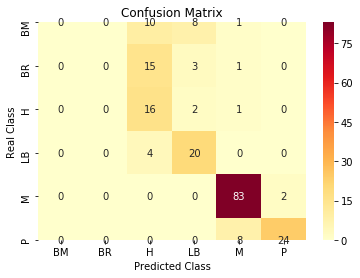

Classification Report
               precision    recall  f1-score   support

black_measles       0.00      0.00      0.00        19
    black_rot       0.00      0.00      0.00        19
      healthy       0.36      0.84      0.50        19
  leaf_blight       0.61      0.83      0.70        24
     mealybug       0.88      0.98      0.93        85
   phylloxera       0.92      0.75      0.83        32

     accuracy                           0.72       198
    macro avg       0.46      0.57      0.49       198
 weighted avg       0.64      0.72      0.66       198



C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [26]:
# Load the trained model from the folder
# model = load_model(filepath=os.path.join(trained_models, 'diseasepest-scratch.h5'))
# model = load_model('diseasepest-scratch.h5')

# Load the saved model from the pre-defined folder
dependencies = {
                       'precision': precision,
                       'recall': recall, 
                       'f1_score': f1_score

}

model = load_model('diseasepest-scratch-worst-weights-1000img.h5', custom_objects=dependencies)

# Display confusion matrix and classification report
collect_metrics(model, generator=valid_test_gen, steps=total_valid)

In [27]:
# model = load_model('diseasepest-scratch.h5')

In [28]:
def get_misclassified_images(input_model, gen, step):
    
    # Look for all misclassified images 
    y_pred = input_model.predict_generator(generator=gen, steps=step)
    y_pred = np.argmax(y_pred, axis=1)
    y_real = gen.classes

    # Show indices of these misclassified images
    global index
    index = np.where(np.not_equal(y_pred, y_real))
    
    # Display paths of misclassified images
    global paths
    paths = [gen.filepaths[i] for i in index[0]]


In [29]:
get_misclassified_images(model, valid_test_gen, total_valid)
index
paths

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  39,
         47,  48,  59,  67,  69,  75, 100, 104, 175, 176, 177, 182, 183,
        190, 191, 193], dtype=int64),)

['.\\img_data\\validation\\black_measles\\black_measles0.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles108.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles11.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles12.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles15.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles16.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles21.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles22.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles31.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles42.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles45.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles58.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles59.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles66.jpg',
 '.\\img_data\\validation\\black_measles\\black_measles71.jpg',
 '.\\img_data\\validation\\black_measles

#### Display all misclassified images

In [30]:
def display_misclassified_images(path, rows, columns):
    from mpl_toolkits.axes_grid1 import ImageGrid
    fig = plt.figure(figsize=(50,50))

    grid = ImageGrid(fig, 111,
                     nrows_ncols=(rows,columns),
                     axes_pad=0.5,
                     )

    for i,file in enumerate(paths):
        subplot_title=plt.title(file.rsplit('\\')[-1]) 
        #grid[i].axes.set_title(subplot_title, fontdict=None, loc='center', color = "k")      
        #grid[i].imshow(PIL.Image.open(file),cmap='gray',interpolation='none')
        ax = grid[i]
        ax.set_title(plt.title(file.rsplit('\\')[-1]), fontdict=None, loc='center', color = "k") 
        im = read_data(file, size=(256, 256))
        ax.imshow(im/255., aspect='auto')
        ax.axis('off')
      #  button = widgets.Button(description='Image %d' % i)
        # Bind the click event to the on_click function, with our index as argument
       # button.on_click(functools.partial(on_click, i))

                # Create a vertical layout box, image above the button
        #box = widgets.VBox([im, button])
        #VBox(children=[box])

        i += 1

    plt.show();
    for i,file in enumerate(paths):     
        im = read_data(file, size=(256, 256))

        button = widgets.Button(description='Image %d' % i)
        # Bind the click event to the on_click function, with our index as argument
        button.on_click(functools.partial(on_click, i))

        # Create a vertical layout box, image above the button
        box = widgets.VBox([im, button])
        VBox(children=[box])

        i += 1

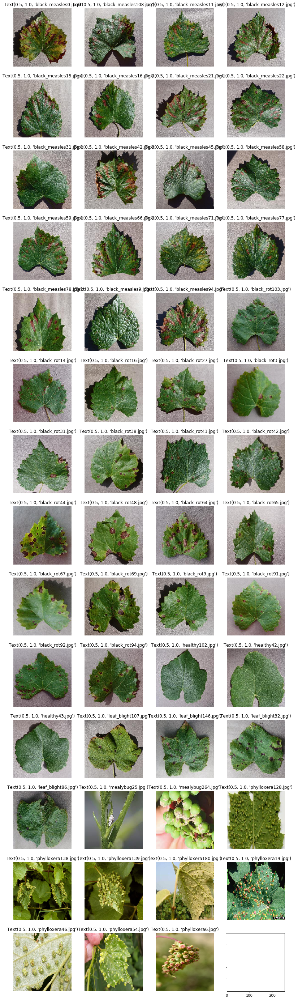

NameError: name 'functools' is not defined

In [32]:
display_misclassified_images(paths, rows = 14, columns = 4)


In [ ]:
%lsmagic


In [ ]:
from ipywidgets import Image
from IPython.display import display, Javascript
im = Image(value=open('img_data/train/black_measles/black_measles4.jpg', 'rb').read())
im.add_class('the_image_class')

def on_image_click():
    #do something....
    return 3

In [ ]:
%%js
js = $(".the_image_class").on("click", function(e){
             var kernel = IPython.notebook.kernel;
             kernel.execute("on_image_click()");
          });

In [ ]:

display(Javascript(js))


In [ ]:
def on_click(index):
    print('Image %d clicked' % index)

import ipywidgets as widgets
import functools
index = 1
button = widgets.Button(description='Image %d' % index)
        # Bind the click event to the on_click function, with our index as argument
button.on_click(functools.partial(on_click, index))

        # Create a vertical layout box, image above the button
box = widgets.VBox([im, button])
VBox(children=[box])

#### Display all misclassified images

In [ ]:
def display_misclassified_images_1(path):
    for i, file in enumerate(path):   
        plt.imshow(Image.open(file))
        plt.title(file.rsplit('\\')[-1])
        f=plt.figure(figsize=(8,7))
        plt.show()

In [ ]:
display_misclassified_images_1(paths)

#### Print all hidden layers

In [ ]:
def print_hidden_layers(input_model):
    tf.compat.v1.disable_eager_execution()
    for layer in input_model.layers:
        hidden_layer = layer.output

        print(hidden_layer)

In [ ]:
print_hidden_layers(model)

#### Display each layer information

In [ ]:
def print_layer_info(input_model):
    from tensorflow.keras.applications.vgg16 import VGG16
    from keras_sequential_ascii import keras2ascii

    conv_base1 = VGG16(include_top=False,
                      weights='imagenet',
                      input_shape=(image_height, image_width, 3))
    keras2ascii(input_model)

In [ ]:
print_layer_info(model)

#### Create a numpy array for an inputted image

In [ ]:

def preprocess_image(img_path, input_model=None, rescale=255, resize=(256, 256)):
    """
    Preprocesses a given image for prediction with a trained model, with rescaling and resizing options
    
    Arguments:
            img_path: The path to the image file
            rescale: A float or integer indicating required rescaling. 
                    The image array will be divided (scaled) by this number.
            resize: A tuple indicating desired target size. 
                    This should match the input shape as expected by the model
    Returns:
            img: A processed image.
    """
    from keras.preprocessing.image import img_to_array, load_img
    import cv2
    import numpy as np

    assert type(img_path) == str, "Image path must be a string"
    assert (
        type(rescale) == int or type(rescale) == float
    ), "Rescale factor must be either a float or int"
    assert (
        type(resize) == tuple and len(resize) == 2
    ), "Resize target must be a tuple with two elements"

    img = load_img(img_path)
    img = img_to_array(img)
    img = img / float(rescale)
    img = cv2.resize(img, resize)
    if model != None:
        if len(model.input_shape) == 4:
            img = np.expand_dims(img, axis=0)

    return img


In [ ]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual, Layout, Button, Box, VBox, HBox, FloatText, Textarea, Dropdown, Label, IntSlider
import ipywidgets as widgets

In [ ]:
def f(x):
    return x

In [ ]:
interact(f, x=10);

In [ ]:
interact(f, x='Hi there!');

In [ ]:
widgets.IntSlider(min=-10, max=30, step=1, value=10)

In [ ]:
def loadimg(b):
    import matplotlib.pyplot as plt
    import PIL
    img_path = "img_data//black_measles//black_measles0.jpg"
    dependencies = {
                       'precision': precision,
                       'recall': recall, 
                       'f1_score': f1_score

    }
    model = load_model('diseasepest-scratch.h5', custom_objects=dependencies)

    plt.figure(figsize=(8,7))
    plt.imshow(PIL.Image.open(img_path))
    plt.show()


#### Display activations

In [ ]:
def display_activations(path, input_mod):
    import cv2
    x = preprocess_image(img_path=path,input_model=input_mod)
    
    # Get activation of an inputted image on all layers
    import keract
    from keract import get_activations
    activations = get_activations(input_mod, x)
    
    # Display activation of an inputted image on all layers
    from keract import display_activations
    display_activations(activations, save=False)

In [ ]:
display_activations(path="img_data//black_measles//black_measles0.jpg", input_mod=model)

In [ ]:
label = widgets.HTML("<h3 class = 'text-center', style = 'color:green'> Load image and Display Activations")

In [ ]:
btn_load_img = widgets.Button(
    description='Load Image',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Load Image',
    icon='check' # (FontAwesome names without the `fa-` prefix)
)
btn_display_activations = widgets.Button(
    description='Display Activations',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Display Activations',
    icon='check' # (FontAwesome names without the `fa-` prefix)
)


btn_load_img.on_click(loadimg)
btn_display_activations.on_click(display_activations)

#btn_load_img

In [ ]:
VBox([label, btn_load_img, btn_display_activations])

In [ ]:
img_path = "img_data//black_measles//black_measles0.jpg"
dependencies = {
                       'precision': precision,
                       'recall': recall, 
                       'f1_score': f1_score

}
model = load_model('diseasepest-scratch.h5', custom_objects=dependencies)

In [ ]:
import cv2
x = preprocess_image(img_path=img_path,model=model)

In [ ]:
# Get activation of an inputted image on all layers
import keract
from keract import get_activations
activations = get_activations(model, x)

In [ ]:
# Display activation of an inputted image on all layers
from keract import display_activations
display_activations(activations, save=False)

In [ ]:
# Display heatmap of activation of an inputted image on all layers
from keract import display_heatmaps
display_heatmaps(activations, x, save=False)

#### Extract weights and bias on each layer

In [ ]:
def extract_weights_bias(input_model):
    # Extract weights and bias on each layer
    for layer in input_model.layers:

        # Get layer name
        print("Layer name: ", layer.name, "\n")

        # Get layer configuration
        print("Layer configuration: ", layer.get_config(), "\n")

        # Get layer weights and bias
        w = layer.get_weights()
        if w != []:
            weights = layer.get_weights()[0]
            bias = layer.get_weights()[1]
            print("Layer weights: ", weights, "\n")
            print("Layer bias: ", bias, "\n")
        else:
            print("Layer weights and bias: ", w)

In [ ]:
extract_weights_bias(model)

#### Get all inbound nodes in each layer

In [ ]:
def get_inbound_nodes(input_model):
    count = 0
    for layer in input_model.layers:
        layer_name = layer.name
        #print('Layer name: ' + layer_name)
        for node in layer._inbound_nodes:
             for i in range(len(node.inbound_layers)):
                    count = count + 1
                    inbound_node_index = node.node_indices
                    strings = [str(integer) for integer in inbound_node_index]
                    a_string = "". join(strings)
                    an_integer = int(a_string)
                    #print(an_integer)
                    print("Inbound nodes of layer " + str(count) + " - layer name: " + layer_name)
                    print(layer.get_input_at(an_integer))
                    print(layer.get_output_at(an_integer))
                    print(layer.get_input_shape_at(an_integer))
                    print(layer.get_output_shape_at(an_integer))
                    print("================================================================================")

In [ ]:
get_inbound_nodes(model)

#### Get all outbound nodes in each layer

In [ ]:
def get_outbound_nodes(input_model):
    count = 0
    for layer in input_model.layers:
        layer_name = layer.name
        for node in layer._outbound_nodes:
            if (node.outbound_layer != None):
                count = count + 1
            #for i in range(count):
                outbound_node_index = node.node_indices
                strings = [str(integer) for integer in outbound_node_index]
                a_string = "". join(strings)
                an_integer = int(a_string)
                #print(an_integer)
                print("Outbound nodes of layer " + str(count) + " - layer name: " + layer_name)
                print(layer.get_input_at(an_integer))
                print(layer.get_output_at(an_integer))
                print(layer.get_input_shape_at(an_integer))
                print(layer.get_output_shape_at(an_integer))
                print("================================================================================")
    print('Total outbound layer:%s' % count)

In [ ]:
get_outbound_nodes(model)


In [ ]:

#importing important libraries
import pymongo
import pandas as pd
import numpy as np
from sklearn import datasets
import pickle
import time
import pymongo

In [ ]:
def save_model_to_db(model, client, db, dbconnection, model_name):
    import pickle
    import time
    import pymongo
    #pickling the model
    pickled_model = pickle.dumps(model)
    
    #saving model to mongoDB
    # creating connection
    myclient = pymongo.MongoClient(client)
    
    #creating database in mongodb
    mydb = myclient[db]
    
    #creating collection
    mycon = mydb[dbconnection]
    info = mycon.insert_one({model_name: pickled_model, 'name': model_name, 'created_time':time.time()})
    print(info.inserted_id, ' saved with this id successfully!')
    
    details = {
        'inserted_id':info.inserted_id,
        'model_name':model_name,
        'created_time':time.time()
    }
    
    return details

In [ ]:

def load_saved_model_from_db(model_name, client, db, dbconnection):
    json_data = {}
    
    #saving model to mongoDB
    # creating connection
    myclient = pymongo.MongoClient(client)
    
    #creating database in mongodb
    mydb = myclient[db]
    
    #creating collection
    mycon = mydb[dbconnection]
    data = mycon.find({'name': model_name})
    
    
    for i in data:
        json_data = i
    #fetching model from db
    pickled_model = json_data[model_name]
    
    return pickle.loads(pickled_model)

In [ ]:
#saving model to mongo
details = save_model_to_db(model = model, client ='mongodb://localhost:27017/', db = 'CMPE295', 
                 dbconnection = 'training_model', model_name = 'diseasepest-scratch')

In [ ]:
import pymongo, gridfs


In [ ]:
f = h5py.File("diseasepest-scratch.h5", "w")

In [ ]:
dset = f.create_dataset("mydataset", (100,), dtype = 'i')

In [ ]:
dset.shape

In [ ]:
dset.dtype

### Transfer Learning

In [ ]:
# Import VGG16
from keras.applications import VGG16

conv_base = VGG16(include_top=False,
                  weights='imagenet',
                  input_shape=(image_height, image_width, 3))

In [ ]:
conv_base.summary()

In [ ]:
# Add more layers into the original VGG16 model
model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(units=6, activation='softmax'))

model.summary()

In [ ]:
# Freeze convolutional base
print('Trainable weights before freezing:', len(model.trainable_weights))
conv_base.trainable = False
print('Trainable weights after freezing:', len(model.trainable_weights))

In [ ]:
# Generate training data using data augmentation
training_datageneration = ImageDataGenerator(
                  rescale=1./255,
                  rotation_range=45,
                  width_shift_range=0.1,
                  height_shift_range=0.1,
                  shear_range=0.1,
                  zoom_range=0.1,
                  horizontal_flip=True,
                  vertical_flip=True)

# Rescale validation data
test_datageneration = ImageDataGenerator(rescale=1./255)

training_gen = training_datageneration.flow_from_directory(
                    train_fold,
                    target_size=(image_height, image_width),
                    color_mode='rgb',
                    batch_size=batch_size,
                    class_mode='categorical',
                    shuffle=True, 
                    seed=50)

valid_gen = test_datageneration.flow_from_directory(
                          val_fold,
                          target_size=(image_height, image_width),
                          color_mode='rgb',
                          batch_size=batch_size,
                          class_mode='categorical')

model.compile(optimizer=optimizers.Adam(lr=0.001),
              loss='categorical_crossentropy',
              metrics=['acc'])

In [ ]:
# Train VGG16 model
history = model.fit(
            training_gen,
            steps_per_epoch=total_train // batch_size,
            epochs=epochs,
            validation_data=valid_gen,
            validation_steps=total_valid // batch_size,
            callbacks=[tensorboard_callback]
)

In [ ]:
# Save the trained model into the pre-defined folder
model.save(os.path.join(trained_models, 'diseasepest-VGG16.h5'))

In [ ]:
plot_data(history, smooth=True)

In [ ]:
# Create a new validation generator for evaluation
valid_test_gen = test_datageneration.flow_from_directory(
                val_fold,
                target_size=(image_height, image_width),
                color_mode='rgb',
                batch_size=1,
                class_mode='categorical',
                shuffle=False)

In [ ]:
# Load the trained model from the folder
model = load_model('diseasepest-VGG16.h5')

# Display confusion matrix and classification report
collect_metrics(model, generator=valid_test_gen, steps=total_valid)

In [ ]:
#model = load_model(filepath=os.path.join(trained_models, 'diseasepest-VGG16.h5'))

In [ ]:
model = load_model('diseasepest-VGG16.h5')

In [ ]:
# Look for all misclassified images 
y_pred = model.predict_generator(generator=valid_test_gen, steps=total_valid)
y_pred = np.argmax(y_pred, axis=1)
y_real = valid_test_gen.classes

# Show indices of these misclassified images
index = np.where(np.not_equal(y_pred, y_real))
index

In [ ]:
# Display paths of misclassified images
paths = [valid_test_gen.filepaths[i] for i in index[0]]
paths

In [ ]:
# Print all hidden layers
tf.compat.v1.disable_eager_execution()
for layer in model.layers:
    hidden_layer = layer.output
    
    print(hidden_layer)

In [ ]:
# Display each layer information
from tensorflow.keras.applications.vgg16 import VGG16
from keras_sequential_ascii import keras2ascii

conv_base1 = VGG16(include_top=False,
                  weights='imagenet',
                  input_shape=(image_height, image_width, 3))
keras2ascii(model)

In [ ]:
img_path = "img_data//black_measles//black_measles0.jpg"

In [ ]:
import matplotlib.pyplot as plt
import PIL
plt.figure(figsize=(8,7))
plt.imshow(PIL.Image.open(img_path))
plt.show()

In [ ]:
import cv2
x = preprocess_image(img_path=img_path,model=model)

In [ ]:
# Get activation of an inputted image on all layers
import keract
from keract import get_activations
activations = get_activations(model, x)

In [ ]:
# Display activation of an inputted image on all layers
from keract import display_activations
display_activations(activations, save=False)

In [ ]:
# Display heatmap of activation of an inputted image on all layers
from keract import display_heatmaps
display_heatmaps(activations, x, save=False)

In [ ]:
for layer in model.layers:

    # Get layer name
    print("Layer name: ", layer.name, "\n")
    
    # Get layer configuration
    print("Layer configuration: ", layer.get_config(), "\n")
    
    # Get layer weights and bias
    w = layer.get_weights()
    if w != []:
        weights = layer.get_weights()[0]
        bias = layer.get_weights()[1]
        print("Layer weights: ", weights, "\n")
        print("Layer bias: ", bias, "\n")
    else:
        print("Layer weights and bias: ", w)

In [ ]:
# get all inbound nodes in each layer
for layer in model.layers:
    for node in layer._inbound_nodes:
         for i in range(len(node.inbound_layers)):
                inbound_node_index = node.node_indices
                strings = [str(integer) for integer in inbound_node_index]
                a_string = "". join(strings)
                an_integer = int(a_string)
                print(an_integer)
                layer.get_input_at(an_integer)
                layer.get_output_at(an_integer)
                layer.get_input_shape_at(an_integer)
                layer.get_output_shape_at(an_integer)

In [ ]:
# get all outbound nodes in each layer
count = 0
for layer in model.layers:
    for node in layer._outbound_nodes:
        if (node.outbound_layer != None):
            count = count + 1
        for i in range(count):
                outbound_node_index = node.node_indices
                strings = [str(integer) for integer in outbound_node_index]
                a_string = "". join(strings)
                an_integer = int(a_string)
                print(an_integer)
                layer.get_input_at(an_integer)
                layer.get_output_at(an_integer)
                layer.get_input_shape_at(an_integer)
                layer.get_output_shape_at(an_integer)
print('Total outbound layer:%s' % count)

### Fine-Tune Model

In [ ]:
conv_base.layers

In [ ]:
# Get the final convolutional block
conv_base.layers[0].name

In [ ]:
# Fine-tune the model by unfreezing the final convolutional block

conv_base.trainable = True
trainable_logic = False

for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    trainable_logic = True
  if trainable_logic:
    layer.trainable = True
  else:
    layer.trainable = False

In [ ]:

# Build custom metrics 
def recall(y_true, y_pred):
    y_true = K.ones_like(y_true) 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    all_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    
    recall = true_positives / (all_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    y_true = K.ones_like(y_true) 
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_score(y_true, y_pred):
    precision1 = precision(y_true, y_pred)
    recall1 = recall(y_true, y_pred)
    return 2*((precision1*recall1)/(precision1+recall1+K.epsilon()))


In [ ]:
# Build custom metrics 
class MulticlassTruePositives(tf.keras.metrics.Metric):
    def __init__(self, name='multiclass_true_positives', **kwargs):
        super(MulticlassTruePositives, self).__init__(name=name, **kwargs)
        self.true_positives = self.add_weight(name='tp', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.reshape(tf.argmax(y_pred, axis=1), shape=(-1, 1))
        values = tf.cast(y_true, 'int32') == tf.cast(y_pred, 'int32')
        values = tf.cast(values, 'float32')
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, 'float32')
            values = tf.multiply(values, sample_weight)
        self.true_positives.assign_add(tf.reduce_sum(values))

    def result(self):
        return self.true_positives

    def reset_states(self):
        # The state of the metric will be reset at the start of each epoch.
        self.true_positives.assign(0.)

In [ ]:
# Check training performance on each epoch
import os

from tensorflow.keras.callbacks import Callback
import matplotlib.pyplot as plt
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc


class PerformanceVisualizationCallback(Callback):
    def __init__(self, model, generator, steps, image_dir):
        super().__init__()
        self.model = model
        self.generator = generator
        self.steps = steps
        
        os.makedirs(image_dir, exist_ok=True)
        self.image_dir = image_dir

    def on_epoch_end(self, epoch, logs={}):
        y_pred = self.model.predict_generator(self.generator, self.steps)
        y_true = self.generator.classes
     
 
        y_pred_class = np.argmax(y_pred, axis=1)

        # plot and save confusion matrix
        fig, ax = plt.subplots(figsize=(16,12))
        plot_confusion_matrix(y_true, y_pred_class, ax=ax)
        fig.savefig(os.path.join(self.image_dir, f'confusion_matrix_epoch_{epoch}'))

       # plot and save roc curve
        fig, ax = plt.subplots(figsize=(16,12))
        plot_roc(y_true, y_pred, ax=ax)
        fig.savefig(os.path.join(self.image_dir, f'roc_curve_epoch_{epoch}'))

In [ ]:
# Log training history to Neptune
from tensorflow.keras.callbacks import Callback
import neptune
import numpy as np
from scikitplot.metrics import plot_confusion_matrix, plot_roc
import matplotlib.pyplot as plt


neptune.init('chittp/sandbox', api_token='eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vdWkubmVwdHVuZS5haSIsImFwaV91cmwiOiJodHRwczovL3VpLm5lcHR1bmUuYWkiLCJhcGlfa2V5IjoiOWIyYjA2NmQtZDQ4Yy00M2E0LTkyOTktNTkyYWFmMjQzMWZmIn0=')
neptune.create_experiment(name='minimal_example')

class NeptuneLoggerCallback(Callback):
    def __init__(self, model, generator, steps):
        super().__init__()
        self.model = model
        self.generator = generator
        self.steps = steps

    def on_batch_end(self, batch, logs={}):
        for log_name, log_value in logs.items():
            neptune.log_metric(f'batch_{log_name}', log_value)

    def on_epoch_end(self, epoch, logs={}):
        for log_name, log_value in logs.items():
            neptune.log_metric(f'epoch_{log_name}', log_value)

        y_pred = self.model.predict_generator(self.generator, self.steps)
        y_true = self.generator.classes

        y_pred_class = np.argmax(y_pred, axis=1)

        fig, ax = plt.subplots(figsize=(16, 12))
        plot_confusion_matrix(y_true, y_pred_class, ax=ax)
        neptune.log_image('confusion_matrix', fig)

        fig, ax = plt.subplots(figsize=(16, 12))
        plot_roc(y_true, y_pred, ax=ax)
        neptune.log_image('roc_curve', fig)

In [ ]:
neptune_logger=NeptuneLoggerCallback(model=model,
                                     generator=valid_test_gen, steps=total_valid)


In [ ]:
from tensorflow.keras import metrics

# Compile the model and avoid overfitting by utilizing a much smaller learning rate
model.compile(optimizer=optimizers.Adam(lr=2e-5),
              loss='categorical_crossentropy',
              metrics=['acc', metrics.mean_squared_error, 
                       metrics.mean_absolute_error, 
                       metrics.mean_absolute_percentage_error,
                       metrics.categorical_accuracy, 
                       precision, 
                       recall, f1_score])

In [ ]:
performance_cbk = PerformanceVisualizationCallback(
                      model=model,
                      generator=valid_test_gen, steps=total_valid,
                      image_dir='performance_vizualizations')


# Train the model
history = model.fit(
            training_gen,
            steps_per_epoch=total_train // batch_size,
            epochs=epochs,
            validation_data=valid_gen,
            validation_steps=total_valid // batch_size,
            callbacks=[tensorboard_callback, performance_cbk, neptune_logger])

In [ ]:
# Save the model into the pre-defined folder
model.save(os.path.join(trained_models, 'diseasepest-VGG16-ft.h5'))

In [ ]:
plot_data(history, smooth=True)

In [ ]:
# Create a new validation generator for evaluation
val_test_gen = test_datageneration.flow_from_directory(
                val_fold,
                target_size=(image_height, image_width),
                color_mode='rgb',
                batch_size=1,
                class_mode='categorical',
                shuffle=False)

In [ ]:
# Load the saved model from the pre-defined folder
dependencies = {
                       'precision': precision,
                       'recall': recall, 
                       'f1_score': f1_score

}

model = load_model('diseasepest-VGG16-ft.h5', custom_objects=dependencies)
#model = load_weights('diseasepest-VGG16-ft.h5')


In [ ]:
# Display confusion matrix and classification report
collect_metrics(model, generator=val_test_gen, steps=total_valid)

### Final Model Evaluation on Test Data

In [39]:
# Create a new test generator for evaluation
test_generator = test_datagenerator.flow_from_directory(
                test_fold,
                target_size=(image_height, image_width),
                color_mode='rgb',
                batch_size=1,
                class_mode='categorical',
                shuffle=False)

Found 251 images belonging to 6 classes.


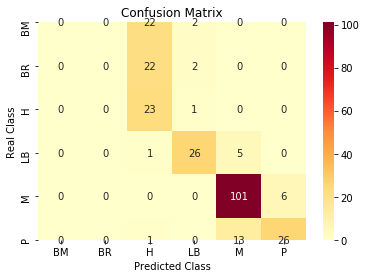

Classification Report
               precision    recall  f1-score   support

black_measles       0.00      0.00      0.00        24
    black_rot       0.00      0.00      0.00        24
      healthy       0.33      0.96      0.49        24
  leaf_blight       0.84      0.81      0.83        32
     mealybug       0.85      0.94      0.89       107
   phylloxera       0.81      0.65      0.72        40

     accuracy                           0.70       251
    macro avg       0.47      0.56      0.49       251
 weighted avg       0.63      0.70      0.65       251



C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\chitt\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [40]:
# Load the saved model from the pre-defined folder
#model = load_model(filepath=os.path.join(trained_models, 'diseasepest-VGG16-ft.h5'), custom_objects=dependencies)
#model = load_model('diseasepest-VGG16-ft.h5', custom_objects=dependencies)
model = load_model('diseasepest-scratch-worst-weights-1000img.h5', custom_objects=dependencies)


# Display confusion matrix and classification report
collect_metrics(model, generator=test_generator, steps=total_test)

In [ ]:
# Look for all misclassified images 
y_pred = model.predict_generator(generator=test_generator, steps=total_test)
y_pred = np.argmax(y_pred, axis=1)
y_real = test_generator.classes

# Show indices of these misclassified images
index = np.where(np.not_equal(y_pred, y_real))
index

In [ ]:
# Display paths of misclassified images
paths = [test_generator.filepaths[i] for i in index[0]]
paths

In [ ]:
model = load_model('diseasepest-scratch.h5')

In [ ]:
# Look for all misclassified images 
y_pred = model.predict_generator(generator=test_generator, steps=total_test)
y_pred = np.argmax(y_pred, axis=1)
y_real = test_generator.classes

# Show indices of these misclassified images
index = np.where(np.not_equal(y_pred, y_real))
index

In [ ]:
# Display paths of misclassified images
paths = [test_generator.filepaths[i] for i in index[0]]
paths

In [ ]:
import keract



In [ ]:
from keract import get_activations
activations = get_activations(model, phylloxera_numpy)

In [ ]:
from keract import display_activations
display_activations(activations, save=False)

In [ ]:
def preprocess_image(img_path, model=None, rescale=255, resize=(256, 256)):
    """
    Preprocesses a given image for prediction with a trained model, with rescaling and resizing options
    
    Arguments:
            img_path: The path to the image file
            rescale: A float or integer indicating required rescaling. 
                    The image array will be divided (scaled) by this number.
            resize: A tuple indicating desired target size. 
                    This should match the input shape as expected by the model
    Returns:
            img: A processed image.
    """
    from keras.preprocessing.image import img_to_array, load_img
    import cv2
    import numpy as np

    assert type(img_path) == str, "Image path must be a string"
    assert (
        type(rescale) == int or type(rescale) == float
    ), "Rescale factor must be either a float or int"
    assert (
        type(resize) == tuple and len(resize) == 2
    ), "Resize target must be a tuple with two elements"

    img = load_img(img_path)
    img = img_to_array(img)
    img = img / float(rescale)
    img = cv2.resize(img, resize)
    if model != None:
        if len(model.input_shape) == 4:
            img = np.expand_dims(img, axis=0)

    return img


In [ ]:
img_path = "img_data//black_measles//black_measles0.jpg"

In [ ]:
import matplotlib.pyplot as plt
import PIL
plt.figure(figsize=(8,7))
plt.imshow(PIL.Image.open(img_path))
plt.show()


In [ ]:
import cv2

In [ ]:
x = preprocess_image(img_path=img_path,model=model)

In [ ]:
activations = get_activations(model, x)

In [ ]:
display_activations(activations, save=False)

In [ ]:
from keract import display_heatmaps
display_heatmaps(activations, x, save=False)


In [ ]:
# Print all hidden layers
tf.compat.v1.disable_eager_execution()
for layer in model.layers:
    hidden_layer = layer.output
    
    print(hidden_layer)

In [ ]:
# Display each layer information
from tensorflow.keras.applications.vgg16 import VGG16
from keras_sequential_ascii import keras2ascii

conv_base1 = VGG16(include_top=False,
                  weights='imagenet',
                  input_shape=(image_height, image_width, 3))
keras2ascii(model)

In [ ]:
# Display each layer information
from keras.models import Sequential
from keras import layers as l
from keras.applications.vgg16 import VGG16
from keras_sequential_ascii import keras2ascii

vgg16 = VGG16(weights=None)
keras2ascii(vgg16)

In [ ]:
# Extract weights and bias on each layer
for layer in model.layers:

    # Get layer name
    print("Layer name: ", layer.name, "\n")
    
    # Get layer configuration
    print("Layer configuration: ", layer.get_config(), "\n")
    
    # Get layer weights and bias
    w = layer.get_weights()
    if w != []:
        weights = layer.get_weights()[0]
        bias = layer.get_weights()[1]
        print("Layer weights: ", weights, "\n")
        print("Layer bias: ", bias, "\n")
    else:
        print("Layer weights and bias: ", w)

In [ ]:
# Extract loss, accuracy, mean absolute error, mean squared error, and cosine proximity of each batch and epoch
class LossAndErrorPrintingCallback(tf.keras.callbacks.Callback):

  def on_train_batch_end(self, batch, logs=None):
    print('\nFor batch {}, loss is {:7.2f}.'.format(batch, logs['loss']))
    print('For batch {}, accuracy is {:7.2f}.'.format(batch, logs['acc']))
    print('For batch {}, mean absolute error is {:7.2f}.'.format(batch, logs['mae']))
    print('For batch {}, mean squared error is {:7.2f}.'.format(batch, logs['mse']))
    print('For batch {}, cosine proximity is {:7.2f}.'.format(batch, logs['cosine']))

  def on_test_batch_end(self, batch, logs=None):
    print('\nFor batch {}, loss is {:7.2f}.'.format(batch, logs['loss']))
    print('For batch {}, accuracy is {:7.2f}.'.format(batch, logs['accuracy']))
    print('For batch {}, mean absolute error is {:7.2f}.'.format(batch, logs['mae']))
    print('For batch {}, cosine proximity is {:7.2f}.'.format(batch, logs['cosine']))

  def on_epoch_end(self, epoch, logs=None):
    print('\nThe average loss for epoch {} is {:7.2f}, accuracy is {:7.2f}, mean absolute error is {:7.2f}, mean squared error is {:7.2f}, and cosine proximity is {:7.2f}.'.format(epoch, logs['loss'], logs['accuracy'], logs['mae'], logs['mse'], logs['cosine']))
    

In [ ]:
# Define custom callback for prediction
class PredictionCallback(tf.keras.callbacks.Callback):    
  def on_epoch_end(self, epoch, logs={}):
    y_pred = self.model.predict(self.validation_data[0])
    print('prediction: {} at epoch: {}'.format(y_pred, epoch))

In [ ]:
# get all inbound nodes in each layer
for layer in model.layers:
    for node in layer._inbound_nodes:
         for i in range(len(node.inbound_layers)):
                inbound_node_index = node.node_indices
                strings = [str(integer) for integer in inbound_node_index]
                a_string = "". join(strings)
                an_integer = int(a_string)
                print(an_integer)
                layer.get_input_at(an_integer)
                layer.get_output_at(an_integer)
                layer.get_input_shape_at(an_integer)
                layer.get_output_shape_at(an_integer)
            

In [ ]:
# get all outbound nodes in each layer
count = 0
for layer in model.layers:
    for node in layer._outbound_nodes:
        if (node.outbound_layer != None):
            count = count + 1
        for i in range(count):
                outbound_node_index = node.node_indices
                strings = [str(integer) for integer in outbound_node_index]
                a_string = "". join(strings)
                an_integer = int(a_string)
                print(an_integer)
                layer.get_input_at(an_integer)
                layer.get_output_at(an_integer)
                layer.get_input_shape_at(an_integer)
                layer.get_output_shape_at(an_integer)
print('Total outbound layer:%s' % count)

In [ ]:
# Extract loss, accuracy, mean absolute error, mean squared error, and cosine proximity of each batch and epoch
import keras
# Define the model.
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(10, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy', 'mae', 'mse', 'cosine'])
(train_images, train_labels), _ = keras.datasets.fashion_mnist.load_data()
train_images = train_images / 255.0

hist = model.fit(
    train_images,
    train_labels, 
    batch_size=64,
    epochs=5,
    callbacks=[LossAndErrorPrintingCallback()])

In [ ]:
import keras
# Define the model.
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(10, activation='softmax')
])


In [ ]:
#Callback class for time history

class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

time_callback = TimeHistory()

In [ ]:
# Define the model.
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=(28, 28)),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dropout(0.2),
    keras.layers.Dense(10, activation='softmax')
])

In [ ]:
# Get avarage training time on each layer
def get_average_layer_train_time(epochs):

    #Loop through each layer setting it Trainable and others as non trainable
    results = []
    for i in range(len(model.layers)):

        layer_name = model.layers[i].name    #storing name of layer for printing layer

        #Setting all layers as non-Trainable
        for layer in model.layers:
            layer.trainable = False

        #Setting ith layers as trainable
        model.layers[i].trainable = True

        #Compile
        model.compile(
            optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy', 'mae', 'mse', 'cosine'])
        (train_images, train_labels), _ = keras.datasets.fashion_mnist.load_data()
        train_images = train_images / 255.0

        #Fit on a small number of epochs with callback that records time for each epoch
        hist = model.fit(
            train_images,
            train_labels, 
            batch_size=200,
            epochs=5,
            callbacks=[time_callback])
            #callbacks=[LossAndErrorPrintingCallback(), time_callback])

        results.append(np.average(time_callback.times))
        #Print average of the time for each layer
        print(f"{layer_name}: Approx (avg) train time for {epochs} epochs = ", np.average(time_callback.times))
    return results

runtimes = get_average_layer_train_time(5)
plt.plot(runtimes)

In [ ]:
import six
import numpy as np
import keras.backend as k
from numpy import float32
def get_activations(x, model, layer, batch_size=128):
    """
    Return the output of the specified layer for input `x`. `layer` is specified by layer index (between 0 and
    `nb_layers - 1`) or by name. The number of layers can be determined by counting the results returned by
    calling `layer_names`.
    :param x: Input for computing the activations.
    :type x: `np.ndarray`. Example: x.shape = (80, 80, 3)
    :param model: pre-trained Keras model. Including weights.
    :type model: keras.engine.sequential.Sequential. Example: model.input_shape = (None, 80, 80, 3)
    :param layer: Layer for computing the activations
    :type layer: `int` or `str`. Example: layer = 'flatten_2'
    :param batch_size: Size of batches.
    :type batch_size: `int`
    :return: The output of `layer`, where the first dimension is the batch size corresponding to `x`.
    :rtype: `np.ndarray`. Example: activations.shape = (1, 2000)
    """

    layer_names = [layer.name for layer in model.layers]
    if isinstance(layer, six.string_types):
        if layer not in layer_names:
            raise ValueError('Layer name %s is not part of the graph.' % layer)
        layer_name = layer
    elif isinstance(layer, int):
        if layer < 0 or layer >= len(layer_names):
            raise ValueError('Layer index %d is outside of range (0 to %d included).'
                             % (layer, len(layer_names) - 1))
        layer_name = layer_names[layer]
    else:
        raise TypeError('Layer must be of type `str` or `int`.')

    layer_output = model.get_layer(layer_name).output
    layer_input = model.input
    output_func = k.function([layer_input], [layer_output])

    # Apply preprocessing
    if x.shape == k.int_shape(model.input)[1:]:
        x_preproc = np.expand_dims(x, 0)
    else:
        x_preproc = x
    assert len(x_preproc.shape) == 4

    # Determine shape of expected output and prepare array
    output_shape = output_func([x_preproc[0][None, ...]])[0].shape
    activations = np.zeros((x_preproc.shape[0],) + output_shape[1:], dtype=float32)

    # Get activations with batching
    for batch_index in range(int(np.ceil(x_preproc.shape[0] / float(batch_size)))):
        begin, end = batch_index * batch_size, min((batch_index + 1) * batch_size, x_preproc.shape[0])
        activations[begin:end] = output_func([x_preproc[begin:end]])[0]

    return activations

In [ ]:
for i in range(len(model.layers)):
    layer_name = model.layers[i].name
    print(layer_name)
    get_activations(train_images, model, layer_name)

In [ ]:
# Display activations on each layer
import keras.backend as K

def get_activations(model, model_inputs, print_shape_only=False, layer_name=None):
    print('----- activations -----')
    activations = []
    inp = model.input

    model_multi_inputs_cond = True
    if not isinstance(inp, list):
        # only one input! let's wrap it in a list.
        inp = [inp]
        model_multi_inputs_cond = False

    outputs = [layer.output for layer in model.layers if
               layer.name == layer_name or layer_name is None]  # all layer outputs

    funcs = [K.function(inp + [K.learning_phase()], [out]) for out in outputs]  # evaluation functions

    if model_multi_inputs_cond:
        list_inputs = []
        list_inputs.extend(model_inputs)
        list_inputs.append(0)
    else:
        list_inputs = [model_inputs, 0]

    # Learning phase. 0 = Test mode (no dropout or batch normalization)
    # layer_outputs = [func([model_inputs, 0.])[0] for func in funcs]
    layer_outputs = [func(list_inputs)[0] for func in funcs]
    for layer_activations in layer_outputs:
        activations.append(layer_activations)
        if print_shape_only:
            print(layer_activations.shape)
        else:
            print(layer_activations)
    return activations

In [ ]:
# Get activations of a specified layer
#get_activations(model, train_images, False, 'flatten_19')

# Get activations of each layer
for i in range(len(model.layers)):
    layer_name = model.layers[i].name
    print('Layer name: ' + layer_name)
    get_activations(model, training_gen, False, layer_name)

In [ ]:
for i in range(len(model.layers)):
    layer_name = model.layers[i].name
    print('Layer name: ' + layer_name)
    model.layers[i].output
    
from keras import backend as K

inp = model.input                                           # input placeholder
outputs = [layer.output for layer in model.layers]          # all layer outputs
functor = K.function([inp, K.learning_phase()], outputs )   # evaluation function

# Testing
test = np.random.random(input_shape)[np.newaxis,...]
layer_outs = functor([test, 1.])
print (layer_outs)

In [ ]:
for out_node in layer._outbound_nodes:
    for outbound_l in out_node.outbound_layer:
        f_tmp.write("\n\toutbound layer name: %s" % (outbound_l.name))
    f_tmp.write("\n\n")

In [ ]:
# Get metrics of each epoch
hist.history.keys()
hist.history

In [ ]:
model.summary()

In [ ]:
_, test_acc = model.evaluate(train_images, train_labels, verbose=0)

In [ ]:
print(test_acc)

In [ ]:
# Get accuracy and loss on each node
model.layers[idx].output.get_shape()

In [ ]:
# Get accuracy and loss on each layer